In [3]:
import pandas as pd

In [4]:
df = pd.read_csv('scalapay_postalcode.csv')

In [5]:
df_backup = df.copy()

In [6]:
df.drop(columns='Unnamed: 0', inplace=True)

In [7]:
from personalpipeline.src.preprocessing import eda

eda = eda.Eda()

In [73]:
eda.missing_values_table(df)

Your selected dataframe has 30 columns.
There are 18 columns that have missing values.


,Missing Values,% of Total Values
shipping_country,4634,4.6
postcode_mapped,4455,4.4
timezone_id,3050,3.0
timezone_current_hour,3050,3.0
current_time_tz,3050,3.0
is_daylight_saving,3050,3.0
city,2443,2.4
currency_code,2427,2.4
is_crawler,2426,2.4
threat_level,2426,2.4


In [8]:
# Data preprocessing 
df['order_created_at' ] =pd.to_datetime(df['order_created_at'])
df['current_time_tz'] = pd.to_datetime(df['current_time_tz'],utc=True )
df["order_created_at"] = df["order_created_at"].dt.tz_localize('UTC')
df['merchant_id'] = df.merchant_id.astype('object')
df['postcode_mapped'] = df['postcode_mapped'].apply(lambda x: str(x).replace(".", "").rstrip("0"))
df['dialing_prefix'] = df.dialing_prefix.astype('object')

In [9]:
print("dataset -  rows:",df.shape[0]," columns:", df.shape[1])

dataset -  rows: 100746  columns: 30


In [10]:
# Target creation

df['fraud_loss_target'] = (df.total_default_pre_collections >0) & (df.total_collections_win == 0)
df['credit_loss_target'] = (df.total_default_pre_collections > 0) & (df.fraud_loss_target == False)

In [11]:
def reduced_percentage(total, part):
    return (print('Reduced percentage represented',100 - (part/total)*100))



In [12]:
# Dropping missing values
df_v1 = df.dropna()
print("dataset without null values -  rows:",df_v1.shape[0]," columns:", df_v1.shape[1])
reduced_percentage(df.shape[0], df_v1.shape[0])


dataset without null values -  rows: 93653  columns: 32
Reduced percentage represented 7.040478033867345


In [13]:
# 93.22% is our working data
# I will drop this values but for future iterations. We can sport the source of missingness and impute the tunere with the mean tunere
df_v2 = df_v1.drop(df_v1.query('total_collections_win != 0  and total_default_pre_collections != 0 and user_tenure_days == 0').index)
print("dataset without Tunure cero anomaly -  rows:",df_v2.shape[0]," columns:", df_v2.shape[1])
reduced_percentage(df.shape[0], df_v2.shape[0])


dataset without Tunure cero anomaly -  rows: 89486  columns: 32
Reduced percentage represented 11.176622396918987


In [14]:
# Plot target variables
df_credit = df_v2.query('fraud_loss_target == 0') # comportamentales, sociodemograficas, group by user
df_fraud = df_v2.copy() # Flags

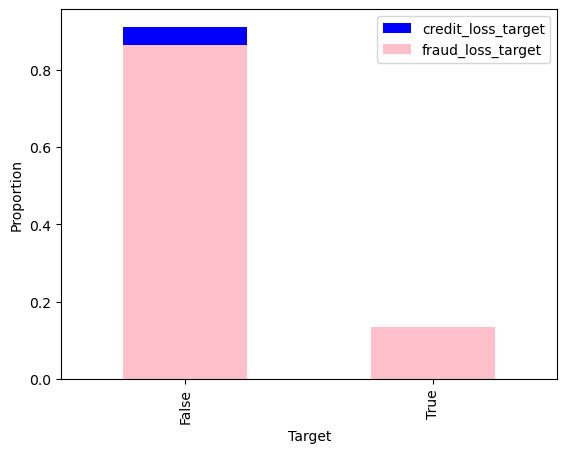

In [15]:
import matplotlib.pyplot as plt
credit_proportions = df_credit['credit_loss_target'].value_counts(normalize=True).rename_axis('target').reset_index(name='proportion')
fraud_proportions = df_fraud['fraud_loss_target'].value_counts(normalize=True).rename_axis('target').reset_index(name='proportion')


# Plot the proportions on a bar chart
fig, ax = plt.subplots()
credit_proportions.plot(x='target', y='proportion', kind='bar', ax=ax, color='blue', label='credit_loss_target')
fraud_proportions.plot(x='target', y='proportion', kind='bar', ax=ax, color='pink', label='fraud_loss_target')


# Add a legend and labels
ax.legend()
ax.set_xlabel('Target')
ax.set_ylabel('Proportion')


# Show the plot
plt.show()



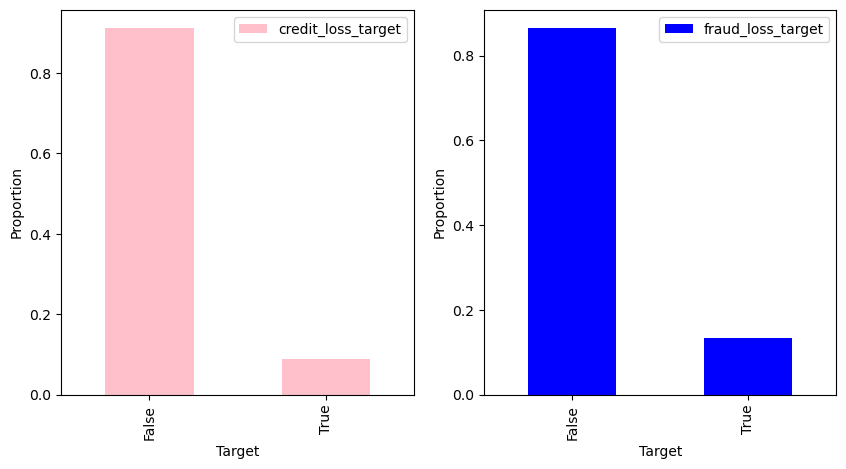

In [16]:


# Get the proportions of each target variable
credit_proportions = df_credit['credit_loss_target'].value_counts(normalize=True)
fraud_proportions = df_fraud['fraud_loss_target'].value_counts(normalize=True)

# Plot the proportions on separate bar charts
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
credit_proportions.plot(kind='bar', ax=ax1, color='pink', label='credit_loss_target')
fraud_proportions.plot(kind='bar', ax=ax2, color='blue', label='fraud_loss_target')

# Add a legend and labels to each chart
ax1.legend()
ax1.set_xlabel('Target')
ax1.set_ylabel('Proportion')
ax2.legend()
ax2.set_xlabel('Target')
ax2.set_ylabel('Proportion')

# Show the plot
plt.show()


In [17]:
# Get the sample size and percentage of sample size for each dataframe
credit_sample_size = df_credit.shape[0]
credit_sample_percentage = credit_sample_size / df_v2.shape[0] * 100
fraud_sample_size = df_fraud.shape[0]
fraud_sample_percentage = fraud_sample_size / df_v2.shape[0] * 100

# Print the sample size and percentage of sample size for each dataframe
print(f'Sample size for df_credit: {credit_sample_size} ({credit_sample_percentage:.2f}%)')
print(f'Sample size for df_fraud: {fraud_sample_size} ({fraud_sample_percentage:.2f}%)')
print('credit proportions',credit_proportions)
print('fraud_proportions',fraud_proportions)


Sample size for df_credit: 77393 (86.49%)
Sample size for df_fraud: 89486 (100.00%)
credit proportions False    0.910987
True     0.089013
Name: credit_loss_target, dtype: float64
fraud_proportions False    0.864862
True     0.135138
Name: fraud_loss_target, dtype: float64


In [18]:
# Extensive EDA

In [19]:
import seaborn as sns
def plot_stats(df, feature,label_rotation=False, horizontal_layout=True, target=None):
    temp = df[feature].value_counts()
    df1 = pd.DataFrame({feature: temp.index,'Number of orders': temp.values})

    # Calculate the percentage of target=1 per category value
    cat_perc = df[[feature, target]].groupby([feature],as_index=False).mean()
    cat_perc.sort_values(by=target, ascending=False, inplace=True)
    
    
    if(horizontal_layout):
        fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12,6))
    else:
        fig, (ax1, ax2) = plt.subplots(nrows=2, figsize=(12,14))
    sns.set_color_codes("pastel")
    s = sns.barplot(ax=ax1, x = feature, y="Number of orders",data=df1)
    if(label_rotation):
        s.set_xticklabels(s.get_xticklabels(),rotation=90)
    
    s = sns.barplot(ax=ax2, x = feature, y=target, order=cat_perc[feature], data=cat_perc)
    if(label_rotation):
        s.set_xticklabels(s.get_xticklabels(),rotation=90)
    plt.ylabel('Percent of target with value 1 [%]', fontsize=10)
    plt.tick_params(axis='both', which='major', labelsize=10)
    plt.title(f'Distribution of {target} in {feature}')
    #print(f'Sample size for df_credit: {credit_sample_size} ({credit_sample_percentage:.2f}%)')

    plt.show()

In [20]:
pd.set_option('display.max_columns', None)
df.head(1)

,order_token,user_token,country_code,dialing_prefix,number_complete_orders,order_created_at,order_amount,funding,merchant_id,total_default_pre_collections,total_collections_win,postcode_mapped,shipping_country,user_tenure_days,user_age,city,currency_code,is_eu,location_language,location_capital,timezone_id,timezone_current_hour,current_time_tz,is_daylight_saving,is_tor,is_proxy,is_crawler,threat_level,deviceid,location_postal_code,fraud_loss_target,credit_loss_target
0,1615KZI86SI0,736842KMCTME95,IT,39,3,2022-02-11 09:46:48+00:00,59.13,prepaid,1557,0.0,0.0,2999203,IT,430,27.0,Milan,EUR,True,it,Rome,Europe/Rome,10.0,2022-02-11 09:47:56+00:00,False,False,False,False,False,2af187362698280d1c08397b2967b14c,Invalid postal code,False,False


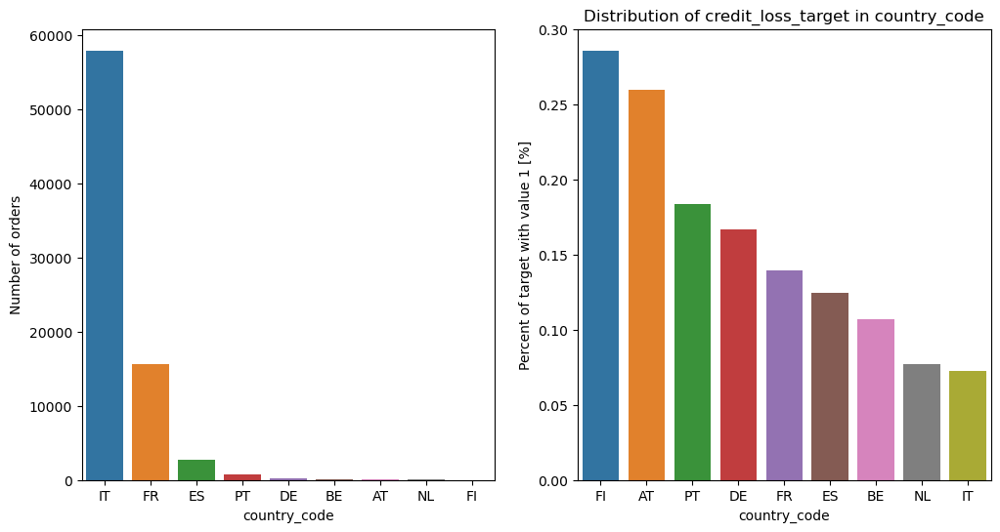

In [21]:
plot_stats(df_credit, 'country_code', target='credit_loss_target')

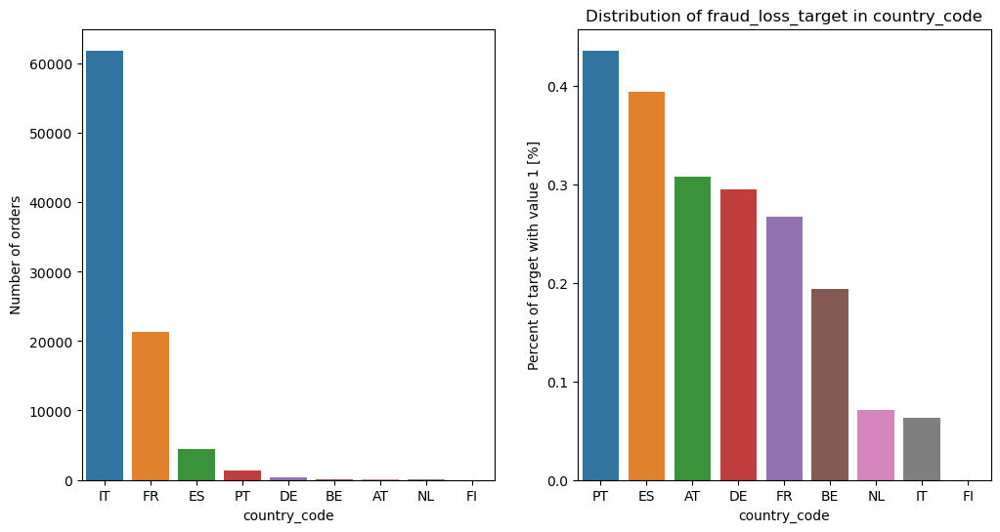

In [22]:
plot_stats(df_fraud, 'country_code', target='fraud_loss_target')

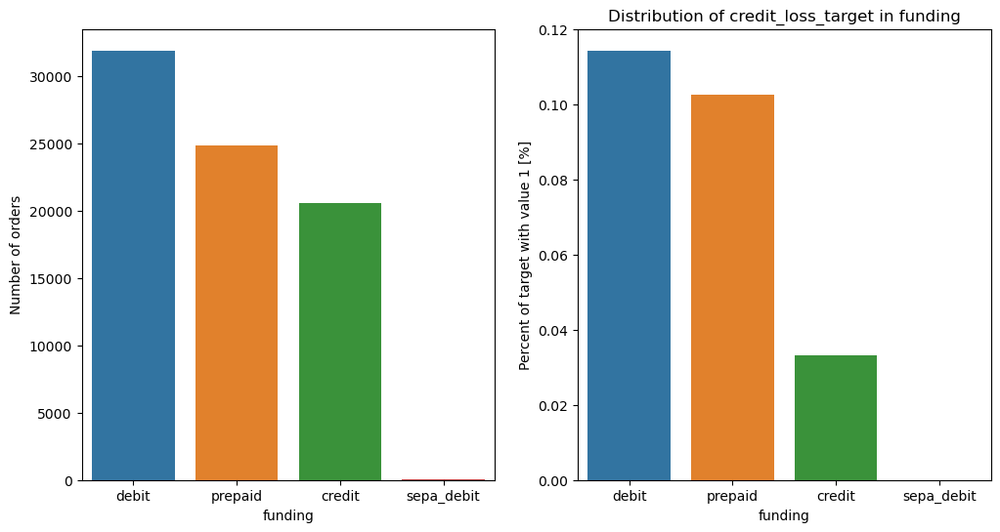

In [23]:
plot_stats(df_credit, 'funding', target='credit_loss_target')

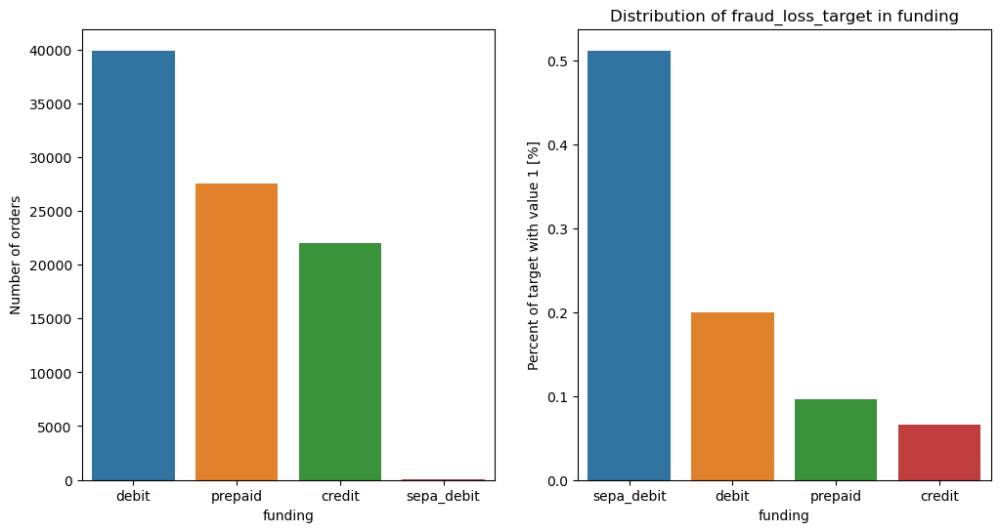

In [24]:
plot_stats(df_fraud, 'funding', target='fraud_loss_target')

In [25]:
df.head(1)

,order_token,user_token,country_code,dialing_prefix,number_complete_orders,order_created_at,order_amount,funding,merchant_id,total_default_pre_collections,total_collections_win,postcode_mapped,shipping_country,user_tenure_days,user_age,city,currency_code,is_eu,location_language,location_capital,timezone_id,timezone_current_hour,current_time_tz,is_daylight_saving,is_tor,is_proxy,is_crawler,threat_level,deviceid,location_postal_code,fraud_loss_target,credit_loss_target
0,1615KZI86SI0,736842KMCTME95,IT,39,3,2022-02-11 09:46:48+00:00,59.13,prepaid,1557,0.0,0.0,2999203,IT,430,27.0,Milan,EUR,True,it,Rome,Europe/Rome,10.0,2022-02-11 09:47:56+00:00,False,False,False,False,False,2af187362698280d1c08397b2967b14c,Invalid postal code,False,False


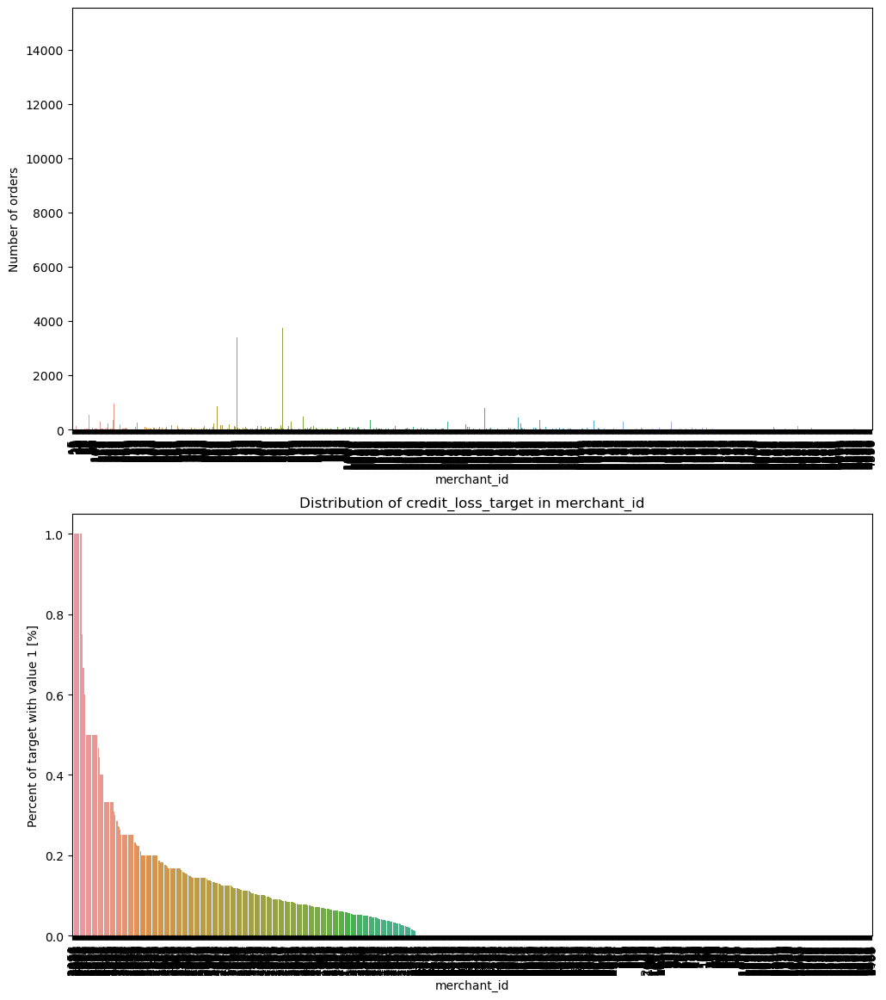

In [26]:
plot_stats(df_credit, 'merchant_id',True, False , target='credit_loss_target')

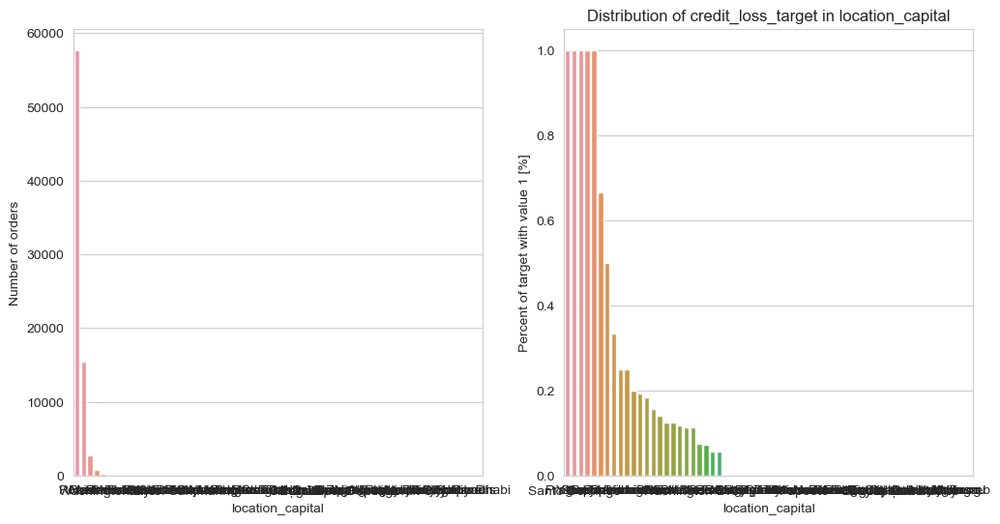

In [93]:
plot_stats(df_credit, 'location_capital', horizontal_layout=True,target='credit_loss_target')

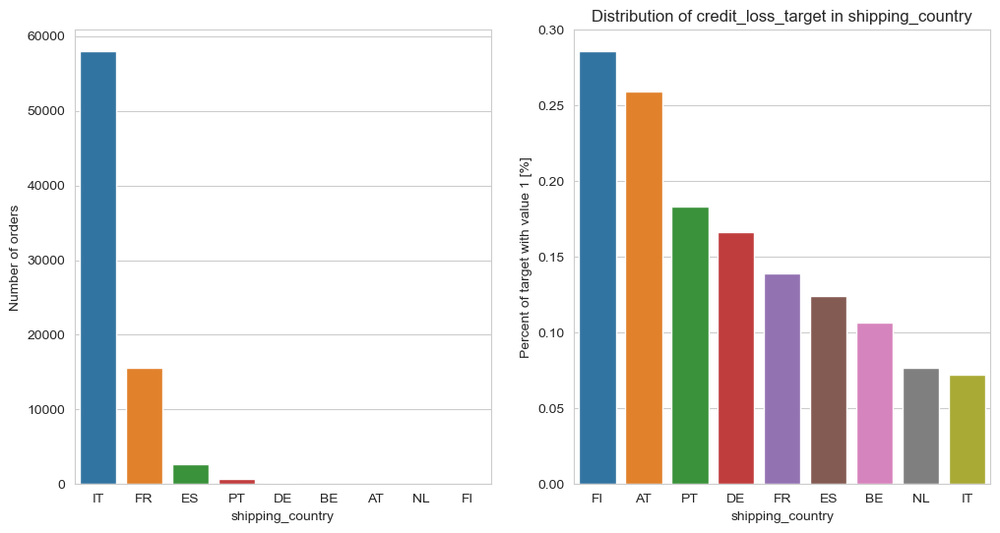

In [94]:
plot_stats(df_credit, 'shipping_country', target='credit_loss_target')

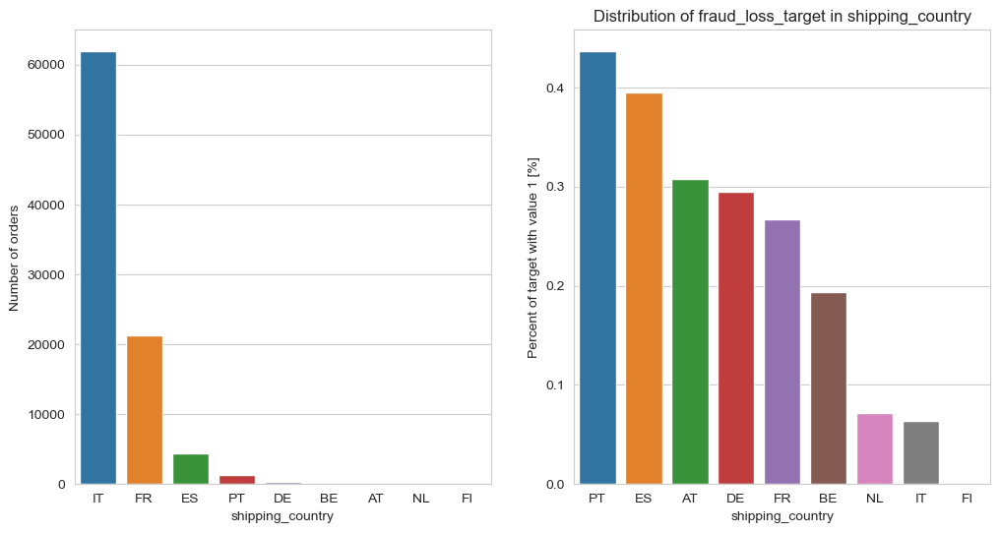

In [95]:
plot_stats(df_fraud, 'shipping_country', target='fraud_loss_target')

In [27]:
def plot_distribution_comp(df,target, var,nrow=2):
    i = 0
    t1 = df.loc[df[target] != 0]
    t0 = df.loc[df[target] == 0]

    sns.set_style('whitegrid')
    plt.figure()
    fig, ax = plt.subplots(nrow,2,figsize=(12,6*nrow))

    for feature in var:
        i += 1
        plt.subplot(nrow,2,i)
        sns.histplot(data=t1, x=feature , stat='density', color='red', bins=30,alpha=0.2  ,label = "TARGET == 1")
        sns.histplot(data =t0, x= feature, stat='density', color='blue', bins=30, alpha=0.2, label = "TARGET == 0")
        plt.ylabel('Hist plot', fontsize=12)
        plt.xlabel(feature, fontsize=12)
        plt.legend()  # added this line to show the legend
        locs, labels = plt.xticks()
        plt.tick_params(axis='both', which='major', labelsize=12)
        plt.title(f'Distribution of {target} ')
    plt.show()


In [97]:
df.head(1)

,order_token,user_token,country_code,dialing_prefix,number_complete_orders,order_created_at,order_amount,funding,merchant_id,total_default_pre_collections,total_collections_win,postcode_mapped,shipping_country,user_tenure_days,user_age,city,currency_code,is_eu,location_language,location_capital,timezone_id,timezone_current_hour,current_time_tz,is_daylight_saving,is_tor,is_proxy,is_crawler,threat_level,deviceid,location_postal_code,fraud_loss_target,credit_loss_target
0,1615KZI86SI0,736842KMCTME95,IT,39,3,2022-02-11 09:46:48+00:00,59.13,prepaid,1557,0.0,0.0,2999203,IT,430,27.0,Milan,EUR,True,it,Rome,Europe/Rome,10.0,2022-02-11 09:47:56+00:00,False,False,False,False,False,2af187362698280d1c08397b2967b14c,Invalid postal code,False,False


<Figure size 640x480 with 0 Axes>

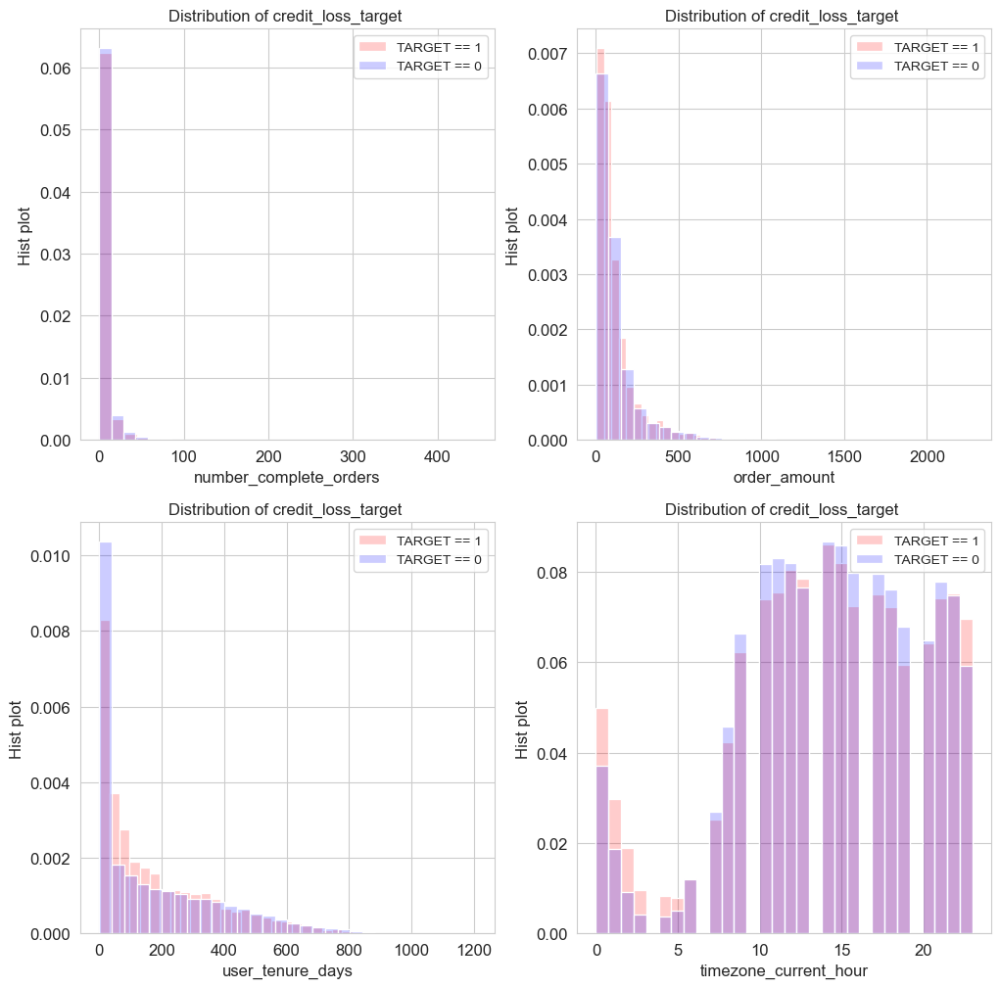

In [98]:
var = ['number_complete_orders','order_amount','user_tenure_days', 'timezone_current_hour']
plot_distribution_comp(df_credit, 'credit_loss_target',var,nrow=2)

<Figure size 640x480 with 0 Axes>

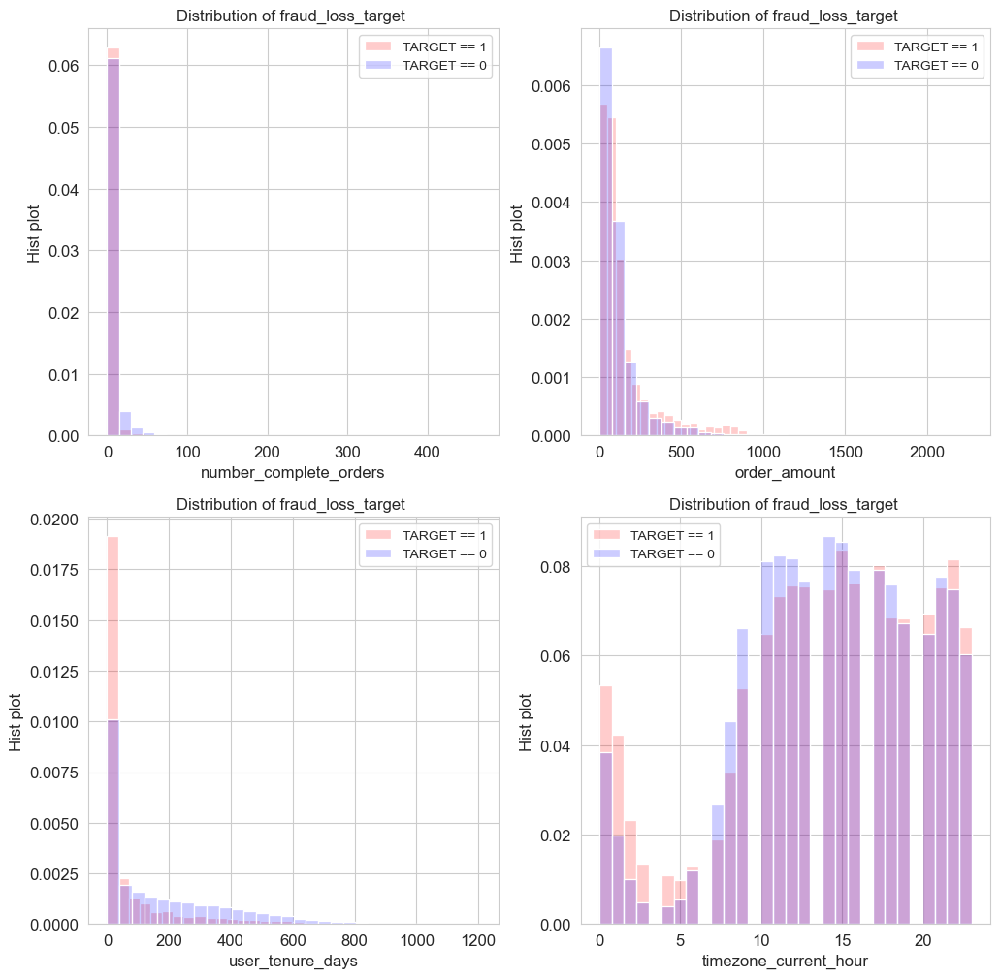

In [99]:
var = ['number_complete_orders','order_amount','user_tenure_days', 'timezone_current_hour']
plot_distribution_comp(df_fraud, 'fraud_loss_target',var,nrow=2)

In [100]:
df_fraud.user_tenure_days.min()

0

<AxesSubplot: xlabel='order_created_at'>

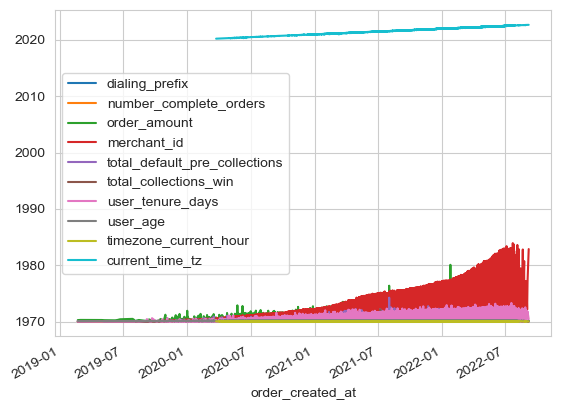

In [101]:
df.set_index('order_created_at').plot()

<AxesSubplot: >

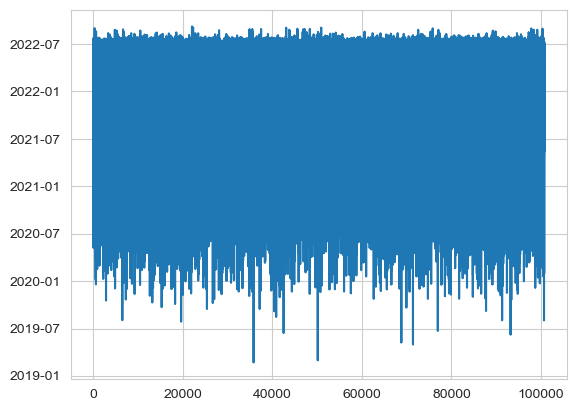

In [102]:
df.order_created_at.plot()

<AxesSubplot: >

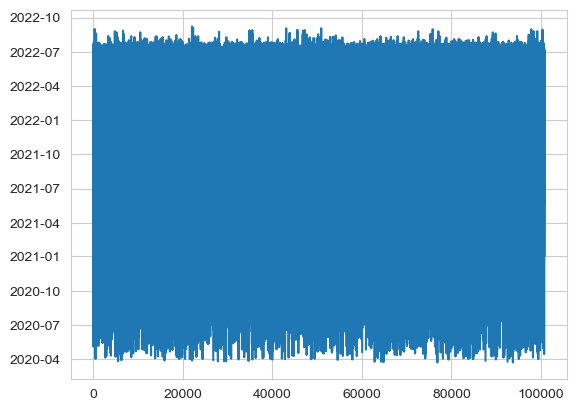

In [103]:
df.current_time_tz.plot()

In [104]:
df_time = df.set_index('order_created_at')

/var/folders/dc/19g8x7m956bdv97zjz8skp8r0000gp/T/ipykernel_62363/3477202128.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df.set_index('order_created_at').resample('M').mean().plot()


<AxesSubplot: xlabel='order_created_at'>

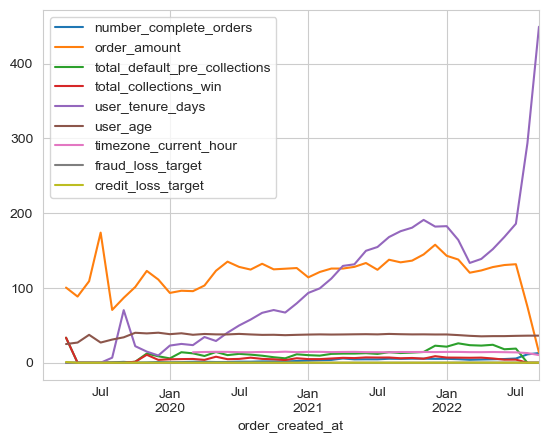

In [105]:
df.set_index('order_created_at').resample('M').mean().plot()

/var/folders/dc/19g8x7m956bdv97zjz8skp8r0000gp/T/ipykernel_62363/3919280101.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.median is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df.set_index('order_created_at').resample('M').median().plot()


<AxesSubplot: xlabel='order_created_at'>

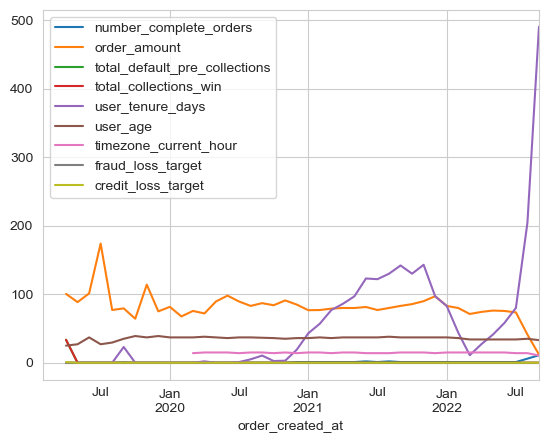

In [106]:
df.set_index('order_created_at').resample('M').median().plot()

<AxesSubplot: xlabel='order_created_at'>

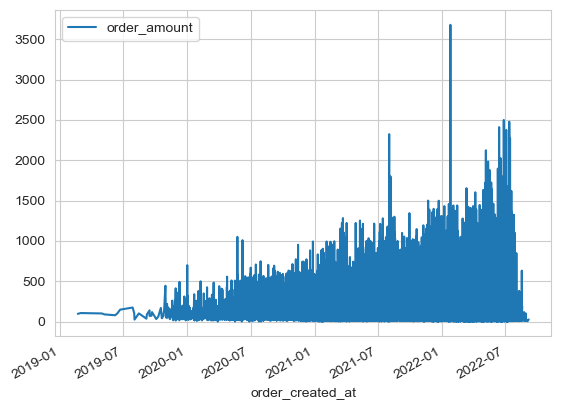

In [107]:
df_time.plot( y='order_amount')

<AxesSubplot: xlabel='order_created_at'>

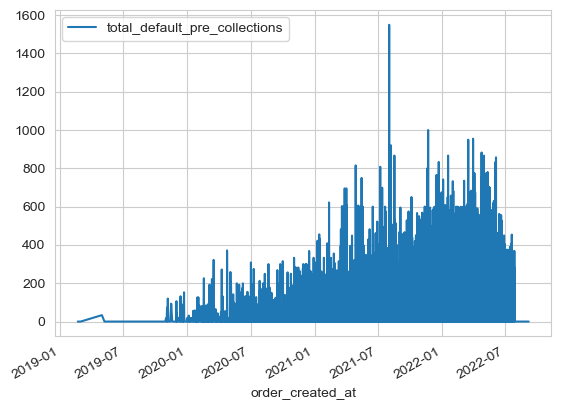

In [108]:
df_time.plot( y='total_default_pre_collections')

<AxesSubplot: xlabel='order_created_at'>

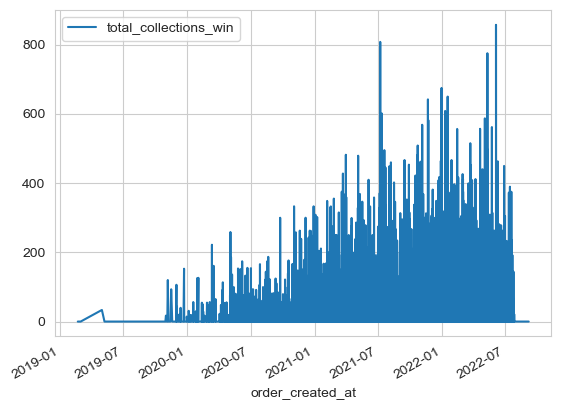

In [109]:
df_time.plot( y='total_collections_win')

In [110]:
print(df.order_created_at.min())
print(df.order_created_at.max())
print(df.current_time_tz.min())
print(df.current_time_tz.max())

2019-02-20 07:37:17+00:00
2022-09-07 06:28:11+00:00
2020-03-23 13:08:47+00:00
2022-09-07 06:29:23+00:00


In [111]:
print(df_v2.order_created_at.min())
print(df_v2.order_created_at.max())
print(df_v2.current_time_tz.min())
print(df_v2.current_time_tz.max())

2020-03-23 13:07:15+00:00
2022-09-07 06:28:11+00:00
2020-03-23 13:08:47+00:00
2022-09-07 06:29:23+00:00


In [112]:
# i FINAL conclusion on why i droped missing values is because I saw inconsstencies in order_creat_at and current_time 

In [113]:
print('Duplicated orders in credit',df_credit[df_credit['order_token'].duplicated(keep=False)].shape)
print('Total duplicated observations in credit',df_credit[df_credit.duplicated(keep = False)].shape)
print('Duplicated orders in fraud',df_fraud[df_fraud['order_token'].duplicated(keep=False)].shape)
print('Total duplicated observations in fraud',df_fraud[df_fraud.duplicated(keep = False)].shape)

Duplicated orders in credit (1257, 32)
Total duplicated observations in credit (144, 32)
Duplicated orders in fraud (1328, 32)
Total duplicated observations in fraud (148, 32)


In [114]:
# let see duplicates 
#df_credit[df_credit['order_token'].duplicated(keep=False)].T



#most_differences = differences.sort_values(ascending=False)
#print(most_differences)




In [115]:
duplicated_orders = df_credit[df_credit['order_token'].duplicated(keep=False)]
duplicated_orders_fraud = df_fraud[df_fraud['order_token'].duplicated(keep=False)]
differences = duplicated_orders.groupby('order_token').apply(lambda x: x.ne(x.iloc[0]).sum())
differences_fraud = duplicated_orders_fraud.groupby('order_token').apply(lambda x: x.ne(x.iloc[0]).sum())

#differences_cat = duplicated_orders.iloc[:, 1:].ne(duplicated_orders.iloc[:, 1:].shift())
#most_differences = differences.sort_values(ascending=False)
#print(most_differences)

In [116]:
differences = differences.loc[:, (differences != 0).any(axis=0)]
differences.sum().T

city                      76
timezone_id                3
timezone_current_hour    142
current_time_tz          602
deviceid                  65
dtype: int64

In [117]:
differences_fraud = differences_fraud.loc[:, (differences_fraud != 0).any(axis=0)]
differences_fraud.sum().T

city                      79
timezone_id                4
timezone_current_hour    152
current_time_tz          639
deviceid                  69
dtype: int64

In [118]:
differences.sort_values(by = 'current_time_tz', ascending=True)
#differences.describe()

,city,timezone_id,timezone_current_hour,current_time_tz,deviceid
order_token,,,,,
D21BKIDFB23J,0,0,0,0,0
11DEKNX6QCYX,0,0,0,0,0
D43KNXGA7MK,0,0,0,0,0
7256KNUE8N69,0,0,0,0,0
7241KGRMD81A,0,0,0,0,0
...,...,...,...,...,...
F25CKKU9PDJO,0,0,0,3,0
E3FKMHV351Z,0,0,3,3,0
A163KK34H1Q2,0,0,1,4,0


In [119]:
differences.query("current_time_tz == 0 and city != 0 and timezone_id != 0 and deviceid != 0")
# current_time esta en todas las diferencias  

,city,timezone_id,timezone_current_hour,current_time_tz,deviceid
order_token,,,,,


In [120]:
differences.query("current_time_tz != 0 and city == 0 and timezone_id == 0 and deviceid == 0").T
# current_time esta en todas las diferencias  

order_token,0122KNSTB4KE,021AKH7G1IZG,022CKK8RLWM8,0243KNOEUIAT,0264KIA3IMD8,0297KHC34WQU,02FAKI01TYYI,0305KJ8KTQPZ,030BKNG49OYF,030CKKSA8VHL,034BKMG7QKGL,034BKNK3GFAF,0368KNLR69Y1,03C9KN4YS09J,03E8KNA3RH5P,078KNZ3E4PB,083KHQ8EWP1,098KM09CMWH,09DKHST5Y8X,09FKLSI9Q11,0A5KN4DRP5N,0B6KNR2MTA9,0C1KN4XCYIR,0F0KNIJPNGR,112EKD1TJCEP,1139KJ7LI42A,119AKMEFUKMT,119AKMJL0XNH,11E2KMSWWC8U,1232KN9GPHBM,1244KNONDYX0,1264KHVPLHBL,127AKNYEEP86,1292KJWUL7AD,12A4KHEFV2CM,1305KLAKR136,1305KLPDE2QD,1305KNH8Y6WZ,130BKNK46U2N,142KDKN332J,144KB4WPRFG,147BKXEQ6UWE,152KCQ10PXR,178FKWL0W3JN,186KFCAATME,19FKDBG99T5,1A3KEMUXOM7,1B6KCX7ESLJ,1BFKYIPLNRG,1C9KHG97BEP,1DBKMV05YCR,1DFK9B2IX3H,210CKI8QKKFP,210EKKI2C5YQ,211FKMOQ8J9P,212AKNYDHZ91,213BKUBKI2GZ,214AKJG130DA,219FKDBGFMUO,21CFKHANC8VC,21F6KICCMBCV,221BKNPQIMI0,2264KHUUGUI6,2264KI6NL5V0,2264KMM41LS2,2264KNJ8FWQK,2283KN9B9FQ2,22DBKZPGCPY6,2305KLF5GAYY,2322KMBNKRK6,2374KZ34ENVQ,2376KUN6HQ63,257KGBC67IU,26D8KVKTSUOD,29DKML62HFT,2DBKIROZ4V8,2E5KI5WYL2F,3101KH28GUA8,3115K9VSPF00,311EKH9NKH6J,319AKMJ41CK1,31A5KNBHT5RH,3211KKJDUG6L,3258KMNJWZ09,325BKO2PPVOK,3264KNTCJ4FD,32F8KMH7IS96,3305KJA29N68,332DKJVRDHNS,352KNK7YFFN,355BKNC92BSO,357KIQ4RJRR,363KJA2C5K8,38EKBAKCIEP,39FKK89VGIW,3A1KMUAHILV,4101K97EFICR,4171KHQEA976,41FBKELU2JZJ,4211KK6JGGP3,4232KN1VG51M,4250KNKKKZQT,425BKMJ21PKL,4264KL2A0MQW,4264KO8FZN9N,4305KMKS0UC6,4305KWKXOPSB,4328KNUNANLJ,435EKN69NW03,4374KMHXZ56J,438BKLUUN6PA,440AKNDTEFFN,440KD4MON2Y,440KMHRQN02,452K8FK6938,457KKFZO5O0,4803KWXOITKV,48AKIRHYB3T,496KHXCF9I5,497KACI0A5P,4DBKE32XYT1,5116KMGIFVQ9,5163KEAEYY2S,51B3KLYZ3CNM,521BKHKFD5TD,5264KMHNFRQP,5264KNN2BSSR,526DKMBBLWSH,5277KO020GKM,527AKLKU6SFW,5305KY1R094M,530CKKMMCMMI,5322KM86PFUQ,537EKMG7FOSA,540KDHTT5BU,540KMASWUA8,5419KNEFPGDU,5438KMDW3P9Q,546KIROS02B,56D5KY1LPCRI,59FKCC1X3W3,59FKJ7L8BAF,5A2KNZ8DXUN,5DBKK2N76FN,6107KMBXR41B,6107KNAAX58J,614AKEX24A3F,6165KME3Y98Z,619AKI3NFCX9,61AFKWCFVTZ9,61C2KNHPEK86,6211KH59CCCB,621BKL5CRTJV,6230KNY0RVTZ,6232KMOIVBOM,6239KN5OVNG4,6258KIQ6TYEN,6264KHNNUR7I,6277KMNHJU92,6290KNIHV79E,62A4KN5X3S5W,6305KK9PLLZK,63FFKLPD5CS7,640BKNXCC2D9,643KCU2YBW5,652KE8TTHB0,652KFI4D206,652KM4OEB75,657KK89YWCQ,67E1KXDWJ1XP,69DKWUWP0CR,69EKO4VDCUF,6BBKFFGYNOX,6C0KGY85F1G,6DBKNCXQ7LK,6ECKIXML7QZ,6F9KNF4FE6Z,6FCKMDW8FM6,710CKNNNV1X6,7114KMAK1AF5,711FKEOQ9QTU,7129KIH5DBLQ,7149KMYU48JV,719AKMCO94AR,719AKN4C59LF,71C7KN8UCJDG,71D4KIJGNAZY,71DEKNOE4W3G,71E7KNARJ7B6,720FKI5SDHWD,7232KMS5SBQ8,7264KH22D4FB,7277KKVJXM41,727BKHNQ990I,7285KJIL2MIQ,72D3KHXW87L9,72F6KJU3GLDB,7305KN3KRXGK,7305KNDNGCVO,7396KYQ97HCJ,740KAIOYY2M,78EKL7W0EA8,79EKIFWL4P6,7DBKMS2636P,7E5KFNXQOFF,8141KMFIKY4T,814AKCOQF0SC,819AKMXW7071,81CKI0S4IRG,8249KIRAIGP6,8264KIIPZ5J2,8264KMYV6OWZ,8264KNSN9YSV,8288KNPMVB5J,82B0KMJPKA1C,82FK8UEAIM1,8305KKIJ8S83,8305KMTLIUA2,8371KMCSGI85,84B8KMSWW3Z0,852KK6WCCR1,86A6L0D3ROMK,89FKMLXE130,8FCKJPRM22A,8FCKLY9NM3X,9101KKZW1CIO,912AKNU5MGKL,918DKN7QZG70,919AKMUZ8XDX,91C2KIOTJJRY,91DKHL19Q11,920FKGGAGW39,921AKGXL4UZ3,921AKHKFX0AO,921BKI2VM6JC,921BKIC8NHKW,921BKKSHCWCK,9232KMG6DS1D,9232KMGJ2VLG,9264KH27F6ZK,9264KHZZL524,9264KK2N679S,9264KMDG7EJ4,9264KMJ59TCO,9264KNEQYUV7,92EAKVTEAKEE,92EFKMYYOD1O,9305KLE3TJ0X,9305KMIZFYNC,930BKNK5EV74,9374KMFV8IIO,937FKYU4Q5LF,9383KMD9KDBH,93F2KLTC2V7O,9409KLXGLNYU,940FKN5YH7HI,944FL0FJTMJG,946KUO1VQ6Q,99DKKZMD2TM,9FEKMN85C1V,A163KK34H1Q2,A18FKNPNG9ZK,A19AKI0FF08N,A19AKMF1C4PB,A19AKND02960,A19KHRKBF3J,A1C2KFZBAHEV,A1CBKJ8SRBEQ,A1FBKMXR3IKZ,A228KH7PZK9C,A232KJ0FMI7C,A232KJKHQ8OU,A253KMKRFRVC,A260KJWPP9QJ,A264KL3S0Y10,A285KHUCLXNL,A2D7KWT7VLOD,A2E0KL2JL4HS,A2FEKWC3BM90,A305KJEVEVZ5,A305KMC6L7XT,A30BKYKOE3J7,A33CKNZLWSGM,A40KEPZDCYT,A40KMXHY3EA,A438KMYBBL4I,A5KB4W1DZM,A788KWZEHU2M,A83KNOZ1W9W,A9DKAZFVIQB,AA1KF1GGA2L,ADBKNUHEH8U,ADBKTO73QY9,AF2KO5T15YD,AF7KMD7Y6AD,B107KYQ1074S,B131KHM8SJKO,B175KNIX1P5A,B19AKMC878K0,B1A5KH14LTO4,B1ABKLUTLLK0,B237KLI4UBAT,B264KHTCP5DU,B264KI6E9IN1,B29CKKJBY953,B2BBKKGSTMYS,B305KLFH1Z62,B305KNVIK29H,B40CKNDJGBE7,B40KKEBH26D,B438KMNNFXRF,B4A5KNDCA9WS,B57KG2E9NFX,B57KMU

In [121]:
differences.query("current_time_tz > 1 and city == 0 and timezone_id == 0 and deviceid == 0").T

order_token,0368KNLR69Y1,0A5KN4DRP5N,1305KLPDE2QD,210EKKI2C5YQ,213BKUBKI2GZ,214AKJG130DA,2283KN9B9FQ2,319AKMJ41CK1,4305KWKXOPSB,438BKLUUN6PA,5A2KNZ8DXUN,652KM4OEB75,657KK89YWCQ,67E1KXDWJ1XP,71E7KNARJ7B6,720FKI5SDHWD,8141KMFIKY4T,82B0KMJPKA1C,8305KMTLIUA2,852KK6WCCR1,86A6L0D3ROMK,92EAKVTEAKEE,9374KMFV8IIO,944FL0FJTMJG,A163KK34H1Q2,A18FKNPNG9ZK,A305KJEVEVZ5,A33CKNZLWSGM,ADBKNUHEH8U,B1A5KH14LTO4,B9FKMGAH1M5,C107KMWJ5LUA,C264KMG5F9J2,C49BKMW94Z8H,D1FEKE84CERX,D34BKNSKU5D3,E1EDKEBMAQE9,E264KJBBH48Y,E3FKMHV351Z,E947KYTBE88D,F1DKG9K92HH,F25CKKU9PDJO
city,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
timezone_id,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
timezone_current_hour,0,0,0,0,0,2,0,0,0,0,0,2,0,0,0,0,1,1,0,0,0,0,1,1,1,0,0,0,0,0,1,0,1,0,2,0,0,0,3,0,0,0
current_time_tz,2,2,2,2,2,2,2,2,2,2,2,2,2,2,3,2,2,2,2,2,2,2,2,2,4,2,4,2,2,2,2,2,2,2,3,2,2,2,3,2,5,3
deviceid,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [122]:
df_credit.query("order_token == 'F1DKG9K92HH'").T

,19227,19228,19229,19230,19231,19232
order_token,F1DKG9K92HH,F1DKG9K92HH,F1DKG9K92HH,F1DKG9K92HH,F1DKG9K92HH,F1DKG9K92HH
user_token,4380FKMCT3V0F,4380FKMCT3V0F,4380FKMCT3V0F,4380FKMCT3V0F,4380FKMCT3V0F,4380FKMCT3V0F
country_code,IT,IT,IT,IT,IT,IT
dialing_prefix,39,39,39,39,39,39
number_complete_orders,0,0,0,0,0,0
order_created_at,2020-10-14 15:40:10+00:00,2020-10-14 15:40:10+00:00,2020-10-14 15:40:10+00:00,2020-10-14 15:40:10+00:00,2020-10-14 15:40:10+00:00,2020-10-14 15:40:10+00:00
order_amount,59.0,59.0,59.0,59.0,59.0,59.0
funding,prepaid,prepaid,prepaid,prepaid,prepaid,prepaid
merchant_id,29,29,29,29,29,29
total_default_pre_collections,0.0,0.0,0.0,0.0,0.0,0.0


In [123]:
df_credit_v1 = df_credit.drop_duplicates(subset='order_token', keep='first')
df_fraud_v1 = df_fraud.drop_duplicates(subset='order_token', keep='first')

# La razon por lo cual removemos duplocados por orden es:
# orden es la primary key
#hemos revisado que la principal columna que tiene duplicados agrupados por orden es la current_time. La cual nos puede llevar a concluir qu esto ha sido a un problema de la collecion e datos 
# Hemos revisado que dentro de todos los duplicados haya alguna columna duplicada que no sea current_time. No es el caso
# Habra que revisar las demas columnas duplicadas y encontrar la razón de esta dupplicidad. Las columnas son:
# city, timezoneid y device  

In [124]:
print("original dataset  -  rows:",df.shape[0]," columns:", df.shape[1])
print("dataset without null values -  rows:",df_v1.shape[0]," columns:", df_v1.shape[1])
reduced_percentage(df.shape[0], df_v1.shape[0])
# 93.22% is our working data
# I will drop this values but for future iterations. We can sport the source of missingness and impute the tunere with the mean tunere
#df_v2 = df_v1.drop(df_v1.query('total_collections_win != 0  and total_default_pre_collections != 0 and user_tenure_days == 0').index)
print("dataset without Tunure cero anomaly and previous debt (Fraud dataset) -  rows:",df_fraud.shape[0]," columns:", df_fraud.shape[1])
reduced_percentage(df_v1.shape[0], df_fraud.shape[0])
print("Dataset for credit loss (fraud_loss_target == 0) -  rows:",df_credit.shape[0]," columns:", df_credit.shape[1])
reduced_percentage(df_fraud.shape[0], df_credit.shape[0])
print("Removed duplicates by order_token keeping the first (Credit dataset) -  rows:",df_credit_v1.shape[0]," columns:", df_credit_v1.shape[1])
reduced_percentage(df_credit.shape[0], df_credit_v1.shape[0])
print("Removed duplicates by order_token keeping the first (Fraud dataset) -  rows:",df_fraud_v1.shape[0]," columns:", df_fraud_v1.shape[1])
reduced_percentage(df_fraud.shape[0], df_fraud_v1.shape[0])

print("Final reduction from the original dataset to credit loss working dataset")
reduced_percentage(df.shape[0], df_credit_v1.shape[0])
print("Final reduction from the original dataset for fraud loss working dataset")
reduced_percentage(df.shape[0], df_fraud_v1.shape[0])

original dataset  -  rows: 100746  columns: 32
dataset without null values -  rows: 93653  columns: 32
Reduced percentage represented 7.040478033867345
dataset without Tunure cero anomaly and previous debt (Fraud dataset) -  rows: 89486  columns: 32
Reduced percentage represented 4.449403649642832
Dataset for credit loss (fraud_loss_target == 0) -  rows: 77393  columns: 32
Reduced percentage represented 13.513845741233268
Removed duplicates by order_token keeping the first (Credit dataset) -  rows: 76726  columns: 32
Reduced percentage represented 0.8618350496814884
Removed duplicates by order_token keeping the first (Fraud dataset) -  rows: 88780  columns: 32
Reduced percentage represented 0.7889502268511279
Final reduction from the original dataset to credit loss working dataset
Reduced percentage represented 23.842137653107827
Final reduction from the original dataset for fraud loss working dataset
Reduced percentage represented 11.877394636015325


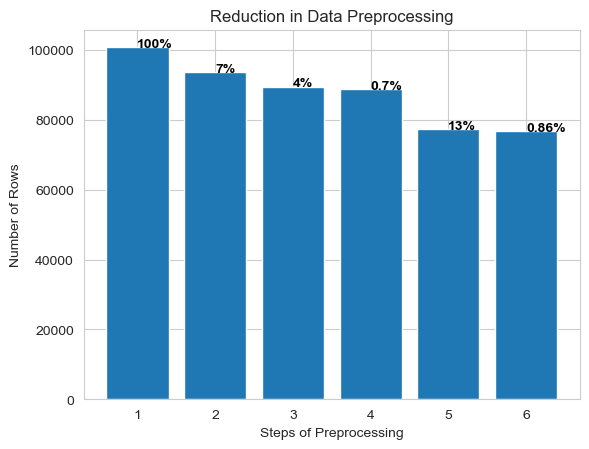

In [125]:
import matplotlib.pyplot as plt

# Create a list of the percentages for each step of the preprocessing
percentages = [100,7, 4, 0.7, 13, 0.86]

# Create a bar plot with the number of rows for each step of the preprocessing
plt.bar([1, 2, 3, 4, 5, 6], [df.shape[0], df_v1.shape[0], df_fraud.shape[0],  df_fraud_v1.shape[0],df_credit.shape[0], df_credit_v1.shape[0]])

# Add the percentage labels to the corresponding bars
for i, v in enumerate([df.shape[0], df_v1.shape[0], df_fraud.shape[0],df_fraud_v1.shape[0] ,df_credit.shape[0], df_credit_v1.shape[0]]):
    plt.text(i + 1, v + 0.05, str(percentages[i]) + "%", color='black', fontweight='bold')

# Add axis labels and a title
plt.xlabel('Steps of Preprocessing')
plt.ylabel('Number of Rows')
plt.title('Reduction in Data Preprocessing')

# Show the plot
plt.show()


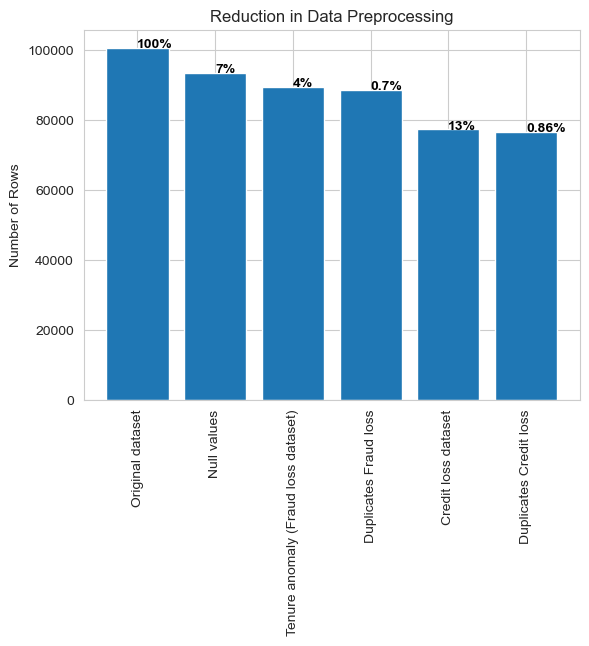

In [126]:
# Create a list of the labels for each step of the preprocessing
labels = ["Original dataset", "Null values", "Tenure anomaly (Fraud loss dataset)", "Duplicates Fraud loss","Credit loss dataset", "Duplicates Credit loss"]

# Create a bar plot with the number of rows for each step of the preprocessing
plt.bar([1, 2, 3, 4, 5, 6], [df.shape[0], df_v1.shape[0], df_fraud.shape[0],  df_fraud_v1.shape[0] ,df_credit.shape[0], df_credit_v1.shape[0]])

# Add the percentage labels to the corresponding bars
for i, v in enumerate([df.shape[0], df_v1.shape[0], df_fraud.shape[0],df_fraud_v1.shape[0] ,df_credit.shape[0], df_credit_v1.shape[0]]):
    plt.text(i + 1, v + 0.05, str(percentages[i]) + "%", color='black', fontweight='bold')
    
# Set the x-axis tick labels
plt.xticks([1, 2, 3, 4, 5, 6], labels, rotation= 90)

# Add axis labels and a title
#plt.xlabel('Steps of Preprocessing')
plt.ylabel('Number of Rows')
plt.title('Reduction in Data Preprocessing')

# Show the plot
plt.show()







In [127]:
# Get the sample size and percentage of sample size for each dataframe
credit_sample_size = df_credit_v1.shape[0]
credit_sample_percentage = credit_sample_size / df.shape[0] * 100
fraud_sample_size = df_fraud_v1.shape[0]
fraud_sample_percentage = fraud_sample_size / df.shape[0] * 100

# Print the sample size and percentage of sample size for each dataframe
print(f'Sample size for df_credit: {credit_sample_size} ({credit_sample_percentage:.2f}%)')
print(f'Sample size for df_fraud: {fraud_sample_size} ({fraud_sample_percentage:.2f}%)')
print('credit proportions',credit_proportions)
print('fraud_proportions',fraud_proportions)

Sample size for df_credit: 76726 (76.16%)
Sample size for df_fraud: 88780 (88.12%)
credit proportions False    0.910987
True     0.089013
Name: credit_loss_target, dtype: float64
fraud_proportions False    0.864862
True     0.135138
Name: fraud_loss_target, dtype: float64


In [128]:
0.911177 *100

91.1177

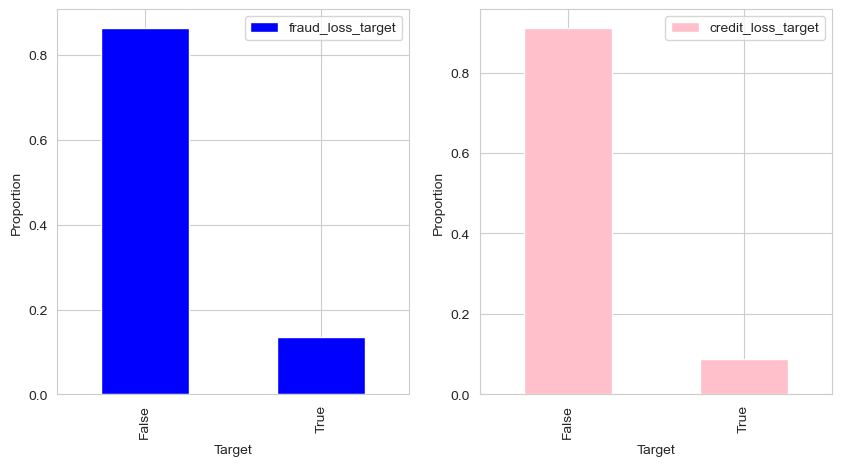

In [129]:
# Get the proportions of each target variable
credit_proportions = df_credit_v1['credit_loss_target'].value_counts(normalize=True)
fraud_proportions = df_fraud_v1['fraud_loss_target'].value_counts(normalize=True)

# Plot the proportions on separate bar charts
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
fraud_proportions.plot(kind='bar', ax=ax1, color='blue', label='fraud_loss_target')
credit_proportions.plot(kind='bar', ax=ax2, color='pink', label='credit_loss_target')


# Add a legend and labels to each chart
ax1.legend()
ax1.set_xlabel('Target')
ax1.set_ylabel('Proportion')
ax2.legend()
ax2.set_xlabel('Target')
ax2.set_ylabel('Proportion')

# Show the plot
plt.show()

Text(0, 0.5, 'Proportion')

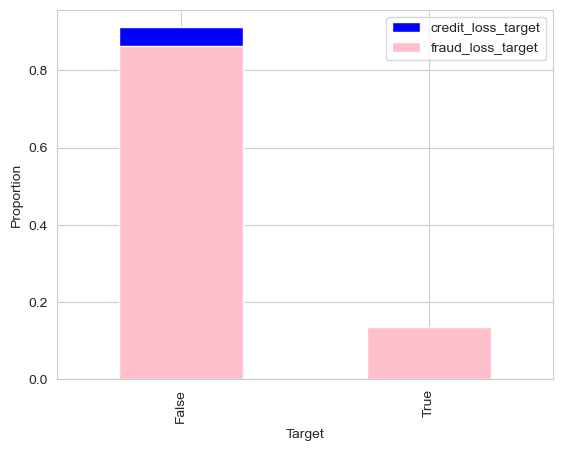

In [130]:
credit_proportions = df_credit_v1['credit_loss_target'].value_counts(normalize=True)
fraud_proportions = df_fraud_v1['fraud_loss_target'].value_counts(normalize=True)


# Plot the proportions on a bar chart
fig, ax = plt.subplots()
credit_proportions.plot(x='target', y='proportion', kind='bar', ax=ax, color='blue', label='credit_loss_target')
fraud_proportions.plot(x='target', y='proportion', kind='bar', ax=ax, color='pink', label='fraud_loss_target')


# Add a legend and labels
ax.legend()
ax.set_xlabel('Target')
ax.set_ylabel('Proportion')


# Show the plot

In [131]:
credit_proportions


False    0.911177
True     0.088823
Name: credit_loss_target, dtype: float64

In [132]:
fraud_proportions

False    0.864226
True     0.135774
Name: fraud_loss_target, dtype: float64

In [ ]:
# How many times was a unique id device used accross multiple accounts?
# How many different names are used for the same shipping adress, or postocde?
# Is there a correlation between telephone number and postocodes?


In [174]:
#df_credit_v1.head()
deviceid_user = df_credit_v1.groupby(['deviceid']).agg({'user_token':'count'})


In [173]:
#df_credit_v1.groupby(['deviceid']).agg({'user_token':'count'}).rename(columns={'user_token':'count_user_token'})

,count_user_token
deviceid,
00039140f3f8ddd9f9fb582815e128ef,1
00054010e5a587323bff71a1940d20cd,8
0005a69370a8a2156ec75f5c2d3fec3c,1
00086ff48e0a50454df12d8c2421ccb9,1
0008c5196af6be0baef9c6156876c585,1
...,...
fffa2aea443c7dee9f1d8db326e80cfc,1
fffbdc6e63d40aca3c0ac5c005909d2e,1
fffdb3043635721cec0ea67f9438dc8f,1


In [175]:
deviceid_user = deviceid_user.reset_index()

In [176]:
deviceid_user

,deviceid,user_token
0,00039140f3f8ddd9f9fb582815e128ef,1
1,00054010e5a587323bff71a1940d20cd,8
2,0005a69370a8a2156ec75f5c2d3fec3c,1
3,00086ff48e0a50454df12d8c2421ccb9,1
4,0008c5196af6be0baef9c6156876c585,1
...,...,...
51044,fffa2aea443c7dee9f1d8db326e80cfc,1
51045,fffbdc6e63d40aca3c0ac5c005909d2e,1
51046,fffdb3043635721cec0ea67f9438dc8f,1
51047,fffe243c3d6fd99e444a2a3c1a111e2a,1


In [177]:
#deviceid_user['count_transform']= deviceid_user.groupby('deviceid')['user_token'].transform('count')

#deviceid_user = deviceid_user.assign(count_transform_v1=df_credit_v1.groupby(['deviceid'])['user_token'].transform('count'))
deviceid_user = deviceid_user.assign(user_count_per_device=df_credit_v1.groupby(['deviceid'])['user_token'].transform('count'))



In [178]:
deviceid_user.sort_values('user_token', ascending=False)

,deviceid,user_token,user_count_per_device
47886,f00e33c378ef9c18abd5bc478bb0efe6,199,4.0
17927,59a10c6fc928b03ae183990259b31b37,193,10.0
35148,b0d62578e6b7550b29d3d77b9167ff39,178,1.0
6598,20d646d2e43db182c88821a5dbd26cff,171,1.0
9058,2d3b1f0630134391cd5dd4edc0ec3599,165,1.0
...,...,...,...
18154,5ac9d4369ce88b661bd96d1a556e463a,1,1.0
18155,5acafdc75937a970f1cb776db1c50037,1,1.0
18156,5acc9e6b8e9aafcd51083537906a0e4c,1,2.0
18157,5acf92ba97b5018c7b5ab652a23f2dec,1,6.0


In [167]:
#deviceid_user.user_token.hist()

deviceid_user['ratio_deviceid_user'] =  (deviceid_user.user_token / deviceid_user.deviceid.size) *100
#deviceid_user.deviceid.size

In [168]:
deviceid_user.sort_values(by = 'user_token', ascending= False)

,deviceid,user_token,count_transform,ratio_deviceid_user
47886,f00e33c378ef9c18abd5bc478bb0efe6,199,1,0.389822
17927,59a10c6fc928b03ae183990259b31b37,193,1,0.378068
35148,b0d62578e6b7550b29d3d77b9167ff39,178,1,0.348685
6598,20d646d2e43db182c88821a5dbd26cff,171,1,0.334972
9058,2d3b1f0630134391cd5dd4edc0ec3599,165,1,0.323219
...,...,...,...,...
18154,5ac9d4369ce88b661bd96d1a556e463a,1,1,0.001959
18155,5acafdc75937a970f1cb776db1c50037,1,1,0.001959
18156,5acc9e6b8e9aafcd51083537906a0e4c,1,1,0.001959
18157,5acf92ba97b5018c7b5ab652a23f2dec,1,1,0.001959


In [166]:
deviceid_user.deviceid.describe()
print(199 / 51049 * 100)

0.38982154400673863


In [184]:
df_credit_v1.query("deviceid == 'f00e33c378ef9c18abd5bc478bb0efe6'").T

,199,433,1113,2622,3566,3672,4524,4792,5350,5824,7381,8034,8147,8350,8570,9012,9585,9605,11235,12378,12648,13028,13217,13358,13899,14161,14320,14336,15025,15281,15607,17345,17788,18022,19050,19083,19826,19977,20586,20672,20860,20934,21349,21778,21820,22762,23195,23223,23326,24322,24489,25148,25532,25678,25790,27615,27787,28435,28608,29156,30123,30511,31031,32226,32683,34235,34700,35957,35973,36178,36693,37497,38066,38232,38245,39209,39218,39517,39600,40199,40776,41092,41760,42500,42874,43435,43979,44052,44339,44495,45092,45177,45273,46083,46425,47485,47873,49178,49352,49365,50205,51139,51373,51589,52389,52936,54465,55155,55802,57352,58664,58686,61309,62664,63172,63894,63909,64429,65189,65231,65235,65401,65835,67241,67432,68617,68739,68791,69094,71268,71523,71611,71708,71791,71915,73649,74318,75285,75589,76192,76379,76597,76740,77261,77453,78548,78817,79878,80231,80659,81257,81777,82075,82289,82386,83335,83551,83907,84406,84415,84808,84990,85988,87156,89280,90747,92253,92349,92634,92991,93055,93383,93472,93813,93844,94223,94697,95063,95434,95502,95765,95791,95884,96015,96115,96260,96795,97736,97758,97980,98098,98314,98548,98728,98902,99267,99445,99632,100109
order_token,762CKU7FN6Z8,D757KUSO2X86,7250KT0J4OHB,B264KS03Y1DV,436AKU141MZR,F9FKSJ4T73O,A3C6KTMNNDAU,35BCKTWY2NAW,C171KTER7VWD,233CKUEH4LP4,0371KS7JKCAQ,D558KRTBL5BG,34F5KTULMTXZ,F2FEKU46HTW7,44B8KT404GXK,F5E6KUOAR64A,F2C2KT777ELI,C1EDKS3RWZ4L,29FKTPOG215,045BKU8D4TFF,E5E6KTLOQNWR,54A2KUBPA0JB,19DKU6WRD2W,8250KT2Y9SPU,3264KSN4IVIS,5803KUPCOI32,6438KTLWAA9Z,8305KUONLJPZ,921BKTFSZZZQ,621BKSZZ59U1,040AKU8T0R4K,4107KTEFPPIT,B31CKSUN2Z4B,81DEKTG500LM,09DKUQI2021,1118KUGPP4G6,4BFKTEH9ESU,040KUFS36TE,6264KU3Z82OJ,6305KSUJKPNJ,18B1L2NSS4JP,E305KUAXPLKU,71DEKTFVJMEC,B438KU3W3CSH,0157KUVDYE6L,4264KSQJUOM6,F3A8KT8XUIY6,121BKTD6QJAA,652KSVKY9DP,EDBKUX4UZ6Q,181KSTBYC1Q,1264KSA8U6H9,2227KU421P33,A118KUTO98EN,C4F4KUIG3CIG,C21AKT39OKFB,25E8KTF39ACH,319AKUITWAOM,9305KU2L4QYG,733CKU7PRI0I,95DEKUMG2JU8,3305KS1F7Z29,T1F8F97LERW4,6448KSA0GS0D,E18CKV3YLN01,0305KTVP5IY9,F59KTODCSMQ,762CL22B1KA9,252KSQARXTF,2107KUDUDNAQ,0512KRW9IISO,B725KUQQIBZN,F9FKTJIW9UB,5438KU8HRX13,11A4KUA3SG73,D21BKS0TEO4K,957KTOXGBP1,027AKUFJ4CRL,481KUJDWP34,C409KSXHP5BV,121BKTYF2N6L,C22CKTFSL539,2232KUFXGZVD,D264KTEGAK0R,F9FKSJHFB7L,BF2KU2WIFR5,397KU2G8O4L,06C8KUSTOGYS,F578KSAN21TT,C264KUMFMBTI,4DBKTZG5172,5250KU0YOUIT,6250KU9UL6HX,D52KSKV6Q7I,213AKU7I4NA2,621AKSD06WG5,8165KT10RMR4,9118KUNP8S09,A305KUMOY047,D305KV5OHJRW,9264KU823TON,9131KTMFK3PC,6318L1UXWEMD,440KT8SBBCR,D9FKV3S6MXV,2232KTEUBMKC,9232KSUBFIZF,5305KS7CSXUD,83C6KUY1EPEI,28EKSZ30JKH,2211KTL6W95R,A25BKV8FZAIG,0312KTPRCSRQ,819KTERIJM9,B232KSVPP2W2,A298KTKI59IF,A305KSSR170T,434BKU1BYGWY,034BKTL52R4R,52A7KU5MH5MH,313BKU153YIQ,C51KUD208HP,857KUQKAXGM,B264KTEBKJLV,F8AKT0FZ9HJ,09FKSUO1GFL,E19AKTHRKL9C,B230KTPKU2HV,E570KSK16I2R,C264KU6T8JJB,9264KTOS6GIN,5264KTEJHN7B,0264KUXB40YC,3K0SBM3UO50H,F178KS3XMLM1,C18EKTO5GHXT,08EKUPWQIXH,D57KSVXS5IQ,4436KSVO4T2D,D159KSPVMNQ7,119AKTXFJZ7W,1305KRXQC3LC,421AKSG6AKWP,12E4L1S63POA,31DEKSA39TM0,3823KV0RQ9UY,444FKV88KVU3,E305KT1HWGJC,C57CKTR6XLFB,81C2KSOINSNX,C777KU0Y71BJ,9178KS4NV3IN,3305KUBFTDZ4,456BKT5CJ64J,C34BKT43OQQC,B376KUEKEVGZ,911EKTV82PJS,4795KUQYB04L,040KT79YSH8,B7B4KU2ETG2F,551KTIRL1A9,2250KSVJGWGS,8305KTBAZY8D,4264KTL68O7C,E9FKTFTG0N8,44E3KT9V85FO,300Z8PPG10AO,140BKUHDKGSS,D305KUFG68Q2,31D9KSVDULK1,336AKSUC0PXV,B78KS7WVHEK,49FKSUEAC85,B21BKSQEA1NT,D6E5L1KD1ZGD,BFBKTUID4ED,7BFKTE1I2HC,6264KT9MRPAM,52CBKSODVI7F,45E6KTUHNAPK,8718KU7U80JV,F19AKV7SC9Y2,DDBKT4IXFSE,B3E0KUDTNIR9,752KU6I9ZY5,3232KSG08M8X,721AKUPCX21Y,6320KTQ92X6Z,5718KSJCP5QX,F5E6KSIPW19W,6438KT91D6O9,227AKSQAKNQJ,3FCKTEIF6KT,A78KTCMTGQ3,D264KTQUNNMB,B8AKTPFJ1YT,1DKTJ4B3OF,A40KRNHG7DH,E35EKSPYVXLX
user_token,33F2FAKMCTNU00,E4C2FBKKQSDU0B,B397C7KMCTMYQ7,B35C15KMCTMBUL,0479B1KMCTPAJ5,1D4KQ6BN9EI,A9KTMNNN6S,61431KMCT2VHP,28BKROZDFZO,134129KMCTLZER,32AKS7JKTTY,924202KMCTJ9KZ,92EE5EKMCTL5LV,321453KMCTIQUB,23F4A7KMCTNUBX,41207CKMCTDDZR,F6416CKN21K9DC,160E40KMS0MM60,0A

In [181]:
user_count_per_device = df_credit_v1.groupby(['deviceid']).agg({'user_token':'count'})
df_credit_v1 = df_credit_v1.assign(user_count_per_device=df_credit_v1.groupby(['deviceid'])['user_token'].transform('count'))




In [183]:
df_credit_v1['transform_count'] = df_credit_v1.groupby(['deviceid'])['user_token'].transform('count')

In [194]:
df_fraud_v1['device_id_count'] = df_fraud_v1.groupby(['deviceid'])['user_token'].transform('count')

/var/folders/dc/19g8x7m956bdv97zjz8skp8r0000gp/T/ipykernel_62363/1145942178.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_fraud_v1['device_id_count'] = df_fraud_v1.groupby(['deviceid'])['user_token'].transform('count')


In [185]:
df_credit_v1['ratio_deviceid_user'] =  (df_credit_v1.user_count_per_device / deviceid_user.deviceid.size) *100

<Figure size 640x480 with 0 Axes>

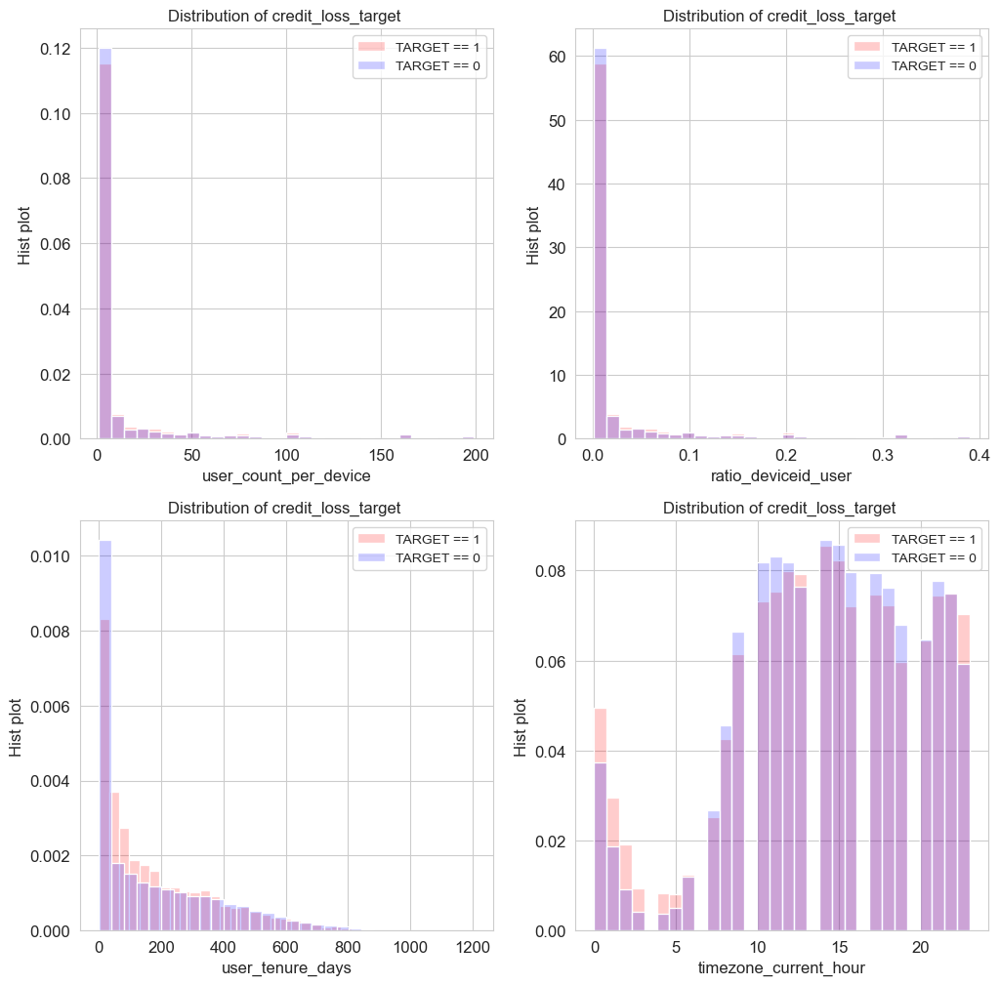

In [200]:
var = ['user_count_per_device','ratio_deviceid_user','user_tenure_days', 'timezone_current_hour']
plot_distribution_comp(df_credit_v1, 'credit_loss_target',var,nrow=2)

<AxesSubplot: xlabel='device_id_count', ylabel='Density'>

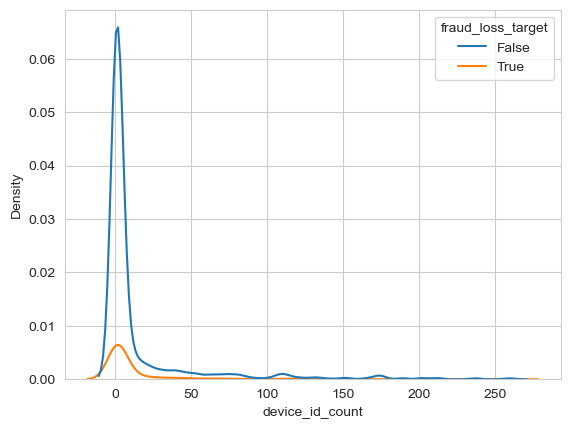

In [195]:
sns.kdeplot(df_fraud_v1.device_id_count, hue=df_fraud_v1.fraud_loss_target)

<Figure size 640x480 with 0 Axes>

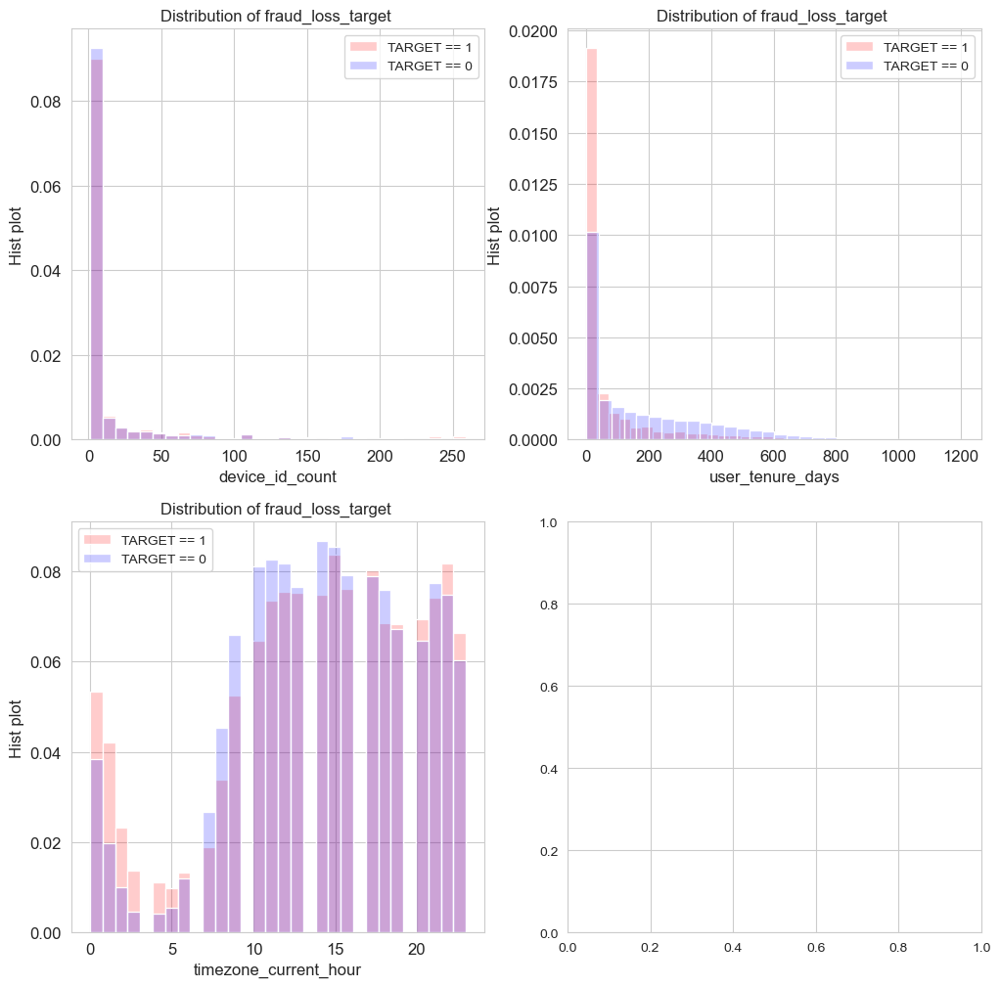

In [202]:
var = ['device_id_count','user_tenure_days', 'timezone_current_hour']
plot_distribution_comp(df_fraud_v1, 'fraud_loss_target',var,nrow=2)

In [208]:
df_fraud_v1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 88780 entries, 0 to 100744
Data columns (total 33 columns):
 #   Column                         Non-Null Count  Dtype              
---  ------                         --------------  -----              
 0   order_token                    88780 non-null  object             
 1   user_token                     88780 non-null  object             
 2   country_code                   88780 non-null  object             
 3   dialing_prefix                 88780 non-null  object             
 4   number_complete_orders         88780 non-null  int64              
 5   order_created_at               88780 non-null  datetime64[ns, UTC]
 6   order_amount                   88780 non-null  float64            
 7   funding                        88780 non-null  object             
 8   merchant_id                    88780 non-null  object             
 9   total_default_pre_collections  88780 non-null  float64            
 10  total_collections_win

In [216]:
import pandas as pd
import matplotlib.pyplot as plt



# Create crosstab
ct = pd.crosstab(df_fraud_v1['dialing_prefix'], df_fraud_v1['postcode_mapped'])



In [217]:
ct

postcode_mapped,2000165,2000823,2006358,2007091,200767,2007791,2009477,2009487,2009961,2010271,2010397,2010474,2010693,2010903,2011561,2012157,2012318,2012355,2012618,2013571,2013612,2013626,2013779,2013897,2014295,2014315,2014543,2014824,201495,2014964,2014981,2015048,2015729,2016005,2016569,2016754,2017066,2017259,2017381,2017693,2018261,201853,2018621,2019062,2019511,2019515,2019632,2020433,2020505,2020532,2020533,2020656,2020684,2020992,2021352,2021538,202166,2021725,20219,2022562,2022709,2023015,2023261,2023376,2023964,2024034,2024235,2024365,2024651,2024782,2024834,2024906,2025159,202526,2025512,2026026,202619,2026211,2026229,2026668,2026857,2027129,2027132,2027514,2027705,2028087,2028252,2028348,2028382,2028566,2029317,2029663,2029694,2029925,2030538,2030686,2031253,2031437,2031632,2031761,2032018,2032181,2032298,2032814,2033189,2033195,2033213,2033359,2033661,2033671,2033866,2034089,2034124,2034469,2034938,2034993,2035011,2035016,2035071,203563,2035788,2036036,2036198,20362,2036261,2036673,2036961,2036972,2037006,2037093,20371,2037197,2037292,2037329,2037453,2037484,2037584,203784,2037962,2037988,2038174,2038442,2038921,2039333,2039387,2039521,2039803,2039827,2039833,2040017,2040109,2040294,2040308,2040347,2041007,204115,2041372,2041714,2041771,2041804,2041851,2041916,2042185,2042199,2042497,2042599,2042602,204269,2042823,2042826,2043009,2043057,2043175,2043268,2043298,2043553,2043893,2043923,2044004,2044055,2044153,2044217,2044501,2044548,2044581,2044918,2044977,2045081,2045088,2045148,2045429,2045886,204592,2045925,2045957,2045962,2046018,2046109,2046212,2046427,2046445,2046451,2046491,2046522,2046672,2046676,2046792,2046878,2046905,2046919,2046986,204714,2047148,2047228,204734,2047458,2047516,204755,2047635,2047691,2047865,2047895,2047907,2048047,2048068,2048071,2048083,2048267,2048799,2049044,2049224,2049483,2049506,2049762,2049959,2050053,2050057,2050065,2050117,2050403,2050546,2050574,2050648,2051226,2051842,2051888,2051987,2052075,2052078,2052287,2052558,2052663,2053272,2053436,2054108,2054403,2054436,2054494,2054528,2054541,2054593,205465,2055048,2055197,2055223,2055229,2055712,2055898,2055904,2055919,205594,205598,2055987,2056007,2056301,2056329,205644,205681,2056887,2056956,2056964,2057089,2057116,2057334,205744,2057537,2057578,205765,2057699,2057755,2057796,2058097,2058291,2058817,2059,2059059,205925,2059369,2059399,2059485,2059511,2059654,2059873,2060016,206004,2060047,2060179,2060725,2061073,2061211,206134,2061378,2061466,2061669,2061691,2061779,20618,2061808,2061877,2062176,2062416,2062436,2062859,2062976,2063538,2063585,2063641,2064079,206411,2064128,2064272,2064442,2064466,2064484,2064586,2064943,2064961,2065222,2065496,206556,2065828,2065845,206586,2065892,2066,2066114,206635,2066383,2066425,2066763,2067126,2067225,2067349,2067413,2067425,2067554,2067559,2067643,2067705,2067802,2067872,2067906,2067997,2068119,2068194,2068197,2068323,2068329,2068345,2068364,2068639,2068654,2068864,2069008,2069023,2069123,2069643,2069811,2069869,2069889,2069902,2070177,2070279,2070356,2070471,2070522,2070539,2070578,2070739,2070893,2070932,2071091,2071493,2071568,2071575,2071745,2071786,2071836,2071905,2072091,2072277,2072287,2072394,2072595,2072805,207283,2072922,2073059,2073083,2073145,2073235,2073541,2073621,2073671,207376,2073955,2074056,2074521,2074565,2074653,2074776,2074932,2074966,2074982,2075138,2075188,2075193,207522,20753,207536,2075532,2075714,2075726,2075942,2076154,2076166,2076208,207631,2076395,2076446,2076521,2076532,2076842,2076875,2076971,2077131,2077257,2077328,2077446,2077487,2077488,2077503,2077527,2077555,2077798,2077893,2078103,2078117,2078144,2078348,2078728,2078759,2079131,2079161,2079266,2079279,2079304,2079314,2079354,2079477,2079694,2079726,207981,2079982,208004,2080102,2080134,2080162,2080493,2080669,2080758,2080784,2081041,2081077,2081107,2081332,2081352,2081388,2081626,2081674,2081827,2081902,2081927,208196,2082173,2082214,2082402,2082527,2082968,2083182,2083241,2083332,2083335,208339,20834

In [212]:
#ct = ct.loc[:, (ct != 0).any(axis=0)]
#differences_fraud.sum().T
ct

postcode_mapped,2000165,2000823,2006358,2007091,200767,2007791,2009477,2009487,2009961,2010271,2010397,2010474,2010693,2010903,2011561,2012157,2012318,2012355,2012618,2013571,2013612,2013626,2013779,2013897,2014295,2014315,2014543,2014824,201495,2014964,2014981,2015048,2015729,2016005,2016569,2016754,2017066,2017259,2017381,2017693,2018261,201853,2018621,2019062,2019511,2019515,2019632,2020433,2020505,2020532,2020533,2020656,2020684,2020992,2021352,2021538,202166,2021725,20219,2022562,2022709,2023015,2023261,2023376,2023964,2024034,2024235,2024365,2024651,2024782,2024834,2024906,2025159,202526,2025512,2026026,202619,2026211,2026229,2026668,2026857,2027129,2027132,2027514,2027705,2028087,2028252,2028348,2028382,2028566,2029317,2029663,2029694,2029925,2030538,2030686,2031253,2031437,2031632,2031761,2032018,2032181,2032298,2032814,2033189,2033195,2033213,2033359,2033661,2033671,2033866,2034089,2034124,2034469,2034938,2034993,2035011,2035016,2035071,203563,2035788,2036036,2036198,20362,2036261,2036673,2036961,2036972,2037006,2037093,20371,2037197,2037292,2037329,2037453,2037484,2037584,203784,2037962,2037988,2038174,2038442,2038921,2039333,2039387,2039521,2039803,2039827,2039833,2040017,2040109,2040294,2040308,2040347,2041007,204115,2041372,2041714,2041771,2041804,2041851,2041916,2042185,2042199,2042497,2042599,2042602,204269,2042823,2042826,2043009,2043057,2043175,2043268,2043298,2043553,2043893,2043923,2044004,2044055,2044153,2044217,2044501,2044548,2044581,2044918,2044977,2045081,2045088,2045148,2045429,2045886,204592,2045925,2045957,2045962,2046018,2046109,2046212,2046427,2046445,2046451,2046491,2046522,2046672,2046676,2046792,2046878,2046905,2046919,2046986,204714,2047148,2047228,204734,2047458,2047516,204755,2047635,2047691,2047865,2047895,2047907,2048047,2048068,2048071,2048083,2048267,2048799,2049044,2049224,2049483,2049506,2049762,2049959,2050053,2050057,2050065,2050117,2050403,2050546,2050574,2050648,2051226,2051842,2051888,2051987,2052075,2052078,2052287,2052558,2052663,2053272,2053436,2054108,2054403,2054436,2054494,2054528,2054541,2054593,205465,2055048,2055197,2055223,2055229,2055712,2055898,2055904,2055919,205594,205598,2055987,2056007,2056301,2056329,205644,205681,2056887,2056956,2056964,2057089,2057116,2057334,205744,2057537,2057578,205765,2057699,2057755,2057796,2058097,2058291,2058817,2059,2059059,205925,2059369,2059399,2059485,2059511,2059654,2059873,2060016,206004,2060047,2060179,2060725,2061073,2061211,206134,2061378,2061466,2061669,2061691,2061779,20618,2061808,2061877,2062176,2062416,2062436,2062859,2062976,2063538,2063585,2063641,2064079,206411,2064128,2064272,2064442,2064466,2064484,2064586,2064943,2064961,2065222,2065496,206556,2065828,2065845,206586,2065892,2066,2066114,206635,2066383,2066425,2066763,2067126,2067225,2067349,2067413,2067425,2067554,2067559,2067643,2067705,2067802,2067872,2067906,2067997,2068119,2068194,2068197,2068323,2068329,2068345,2068364,2068639,2068654,2068864,2069008,2069023,2069123,2069643,2069811,2069869,2069889,2069902,2070177,2070279,2070356,2070471,2070522,2070539,2070578,2070739,2070893,2070932,2071091,2071493,2071568,2071575,2071745,2071786,2071836,2071905,2072091,2072277,2072287,2072394,2072595,2072805,207283,2072922,2073059,2073083,2073145,2073235,2073541,2073621,2073671,207376,2073955,2074056,2074521,2074565,2074653,2074776,2074932,2074966,2074982,2075138,2075188,2075193,207522,20753,207536,2075532,2075714,2075726,2075942,2076154,2076166,2076208,207631,2076395,2076446,2076521,2076532,2076842,2076875,2076971,2077131,2077257,2077328,2077446,2077487,2077488,2077503,2077527,2077555,2077798,2077893,2078103,2078117,2078144,2078348,2078728,2078759,2079131,2079161,2079266,2079279,2079304,2079314,2079354,2079477,2079694,2079726,207981,2079982,208004,2080102,2080134,2080162,2080493,2080669,2080758,2080784,2081041,2081077,2081107,2081332,2081352,2081388,2081626,2081674,2081827,2081902,2081927,208196,2082173,2082214,2082402,2082527,2082968,2083182,2083241,2083332,2083335,208339,20834

In [218]:
#ct.sum().sort_values(ascending=False)
from scipy.stats import chi2_contingency



# Chi-squared test
stat, p, dof, expected = chi2_contingency(ct)

# Interpreting the test results
if p < 0.05:
    print("There is a significant association between the two variables.")
else:
    print("There is no significant association between the two variables.")


There is a significant association between the two variables.


In [219]:
ct.sum().sort_values(ascending=False)

postcode_mapped
2969742      265
2024834      230
2798956      229
3050087      224
2536986      196
            ... 
2522215        1
2522212        1
2522149        1
2521989        1
903865443      1
Length: 11552, dtype: int64

In [223]:
df_fraud_v1.query("postcode_mapped == '2969742' " ).T

,89472,89488,89490,89502,89505,89547,89550,89555,89567,89582,89592,89629,89648,89682,89722,89751,89758,89793,89795,89801,89810,89811,89816,89823,89826,89827,89831,89835,89853,89880,89904,89918,89955,89986,89989,89998,90025,90041,90042,90063,90073,90094,90111,90113,90132,90155,90158,90177,90195,90229,90262,90268,90272,90288,90297,90300,90306,90320,90339,90350,90415,90425,90443,90446,90454,90480,90494,90503,90527,90533,90550,90566,90580,90581,90599,90604,90606,90616,90624,90625,90626,90667,90668,90677,90679,90684,90688,90709,90744,90752,90758,90768,90799,90825,90840,90857,90863,90865,90926,90937,90964,90968,90974,90993,91004,91018,91021,91024,91028,91047,91077,91078,91084,91094,91096,91121,91131,91138,91156,91159,91169,91172,91180,91191,91202,91242,91279,91287,91312,91329,91338,91364,91370,91375,91390,91420,91428,91440,91450,91454,91456,91468,91500,91501,91525,91531,91537,91555,91564,91603,91612,91628,91633,91647,91648,91649,91665,91674,91681,91715,91718,91748,91765,91770,91785,91804,91818,91823,91853,91856,91863,91866,91869,91882,91895,91910,91914,91981,91995,91996,92019,92114,92115,92131,92143,92147,92149,92168,92190,92216,92251,92253,92266,92285,92330,92339,92350,92356,92366,92393,92397,92411,92419,92424,92428,92431,92437,92441,92442,92486,92503,92522,92529,92538,92541,92584,92610,92627,92639,92644,92647,92673,92675,92719,92726,92727,92735,92739,92742,92755,92767,92788,92792,92808,92855,92857,92858,92866,92871,92880,92908,92912,92936,92940,92951,92961,92993,93001,93006,93010,93035,93065,93073,93075,93081,93090,93091,93097,93099,93124,93171,93184,93201,93235,93240
order_token,5230KO17SVV1,26D6L1DERLA3,D21AKO5IIP5V,29FKIHW5RSJ,D19KGC0OOJE,8B6KDLJ8SQU,521BKZJRBQ1W,91A2KSXSNKMI,5762L17NC225,1DBKXGGHLDI,D305L2YDZWT7,E264KSPZSHQI,019DKZBRAHPM,2266KW9J42F9,Z419MGEOMZKP,B1565JHOZO8E,D305KK9U02ZF,LMJMT6UUL55J,4H3TR3NRDNY3,2452KV140M4D,BA25L32P0SFB,948BL2HEKOY3,3246KR4LN4OZ,1IUAOYKAYXTE,B13FKUE14DLY,F1DEKTMYCKEH,BC3KD421TCZ,9165KPNRNRS8,1981KZ7A99OQ,A2D3KPZO9YT1,6DWOWXQTA7SF,0A25KYVTARG6,21FBKUA806EY,110CKG0UN8SY,1264KPQOPBO8,1363KYAKEM06,83EDKTOI6THE,D1EDKREX4UFF,D264L2LZ2WGJ,E8AKQIGVC6L,7246KNO9HEOH,8X30OF54AOO7,D232KL11LL11,7803L1MQ94PK,A1EDKKVJ3U7L,3250KX8X9XP1,6QIWHYDI3P7L,A264KM62WIF6,BDFKBSDJOX2,4394L13NR448,7B1KN4TJM8Z,2264KPITK7SX,5305KLZBWPHJ,QLPAN0L54SEX,C57KQ4B6IGX,E21AKVV089JG,925BKJ11EDG0,9DBKY0AGYZC,21D1KOTXGVGM,76D4KZVSLWWV,9L3K0FFDVM7R,855KNQ2MWL6,9232KU871565,BNX6R30PH0WU,F21AKJSX2NQ2,PEP8KMPXKCAT,B422KU0YCMN3,AX1HGZI67U75,921AKXHLHVJK,A305KM56R3BY,1A25L343LUGT,D305KJONB25Y,4232KSVTSCRZ,6232KPVGVHOP,98ABKZ7E16IS,2A25L21Y45IE,154AL21P85KW,49DKR7ND5UD,95E7KWXIYWGW,E21BKR2AFJJZ,D312KZE6IMDI,5A25KZFPWX11,B725KYX3XR24,C19AKJBZDZV2,9DBKNASVT2W,457KNBIK2MT,LR4G9JA640TN,42B1KO9UAMLI,E826KYW919SX,8165KVZM1BSA,KXC74RLFPCCF,070EL31CLDDM,559EKTWFSZJY,16CAL05N1IRN,0258KPMPDJCY,6A25L1XAG9YM,3458KTES9PY9,721AKY0IZQKD,8748KWHT8MU9,1232KUO2KSBK,SBIL9KHV3ILM,86D6L0CH4V78,C19AKYJ3625Z,359EL1JDXKYA,99FKTOS38Q1,C620KZZIAI35,DA25L1VY20GX,7981L1VAVEKH,8981L1VY7SYP,KGBJ9I31UYIR,A1A3L2MUS2DH,2434KUMPRETO,TK365W8J5599,FA25L00T9LI6,6264KUUWBGS3,5A25L1QLDMFT,A651KX9I5TOF,B1D4KL3O8AAM,C232KL9NB136,F358KMM0MZMC,91FBKRMC3NL7,HDOIS4HLAE1B,06D6KUO3VV18,B7FKDBEVSSP,21D1KTH91C6G,48D5L08L1S7G,M0EQLPH3G2CY,AA25L37MV8T6,C42KWXUGYWY,7230KUJL2YL7,312EKPGP96HA,5178KZQMMRZO,2JRXWLX0NITL,683KUFL1HTW,A637KZ1PSO8A,3EZVM9JJH6X8,1VGG4E4AT3UY,B369KZFOEVV3,TAPSEA9POHGY,919AKWHV0S0G,364EKY51EBMN,WAXH70AMWZFD,9A25L0X2TAE2,D243KS8TE9EF,27EKN0H28HI,5A25L0JK9L32,937DL1530E9W,E165KIX1DVLK,C258KHXX54G7,4264KLPOX2HP,56F3KV47JHDM,E2B7KP1OSD54,112EKM29907H,840L1VX6VKH,DA25L0L1MXYY,71FEKNBSYOJJ,CDU71KWE7E3J,D264KYVK0PTA,031KD8N09CY,2VY76I3J0HN5,44A3KPZ3RDES,159EL34Q28CI,7305KYA9U164,54F5L37O5KBD,TLS71KMS36GX,A374KWE3RTXU,ZA6XDBYSOQFQ,C305KXEJV0X0,521AKWJLMT4C,421BKYPURVJG,7B20L0JYAI3N,4305KVXPDUB0,321AKMFYD5J2,E4AAKSRCU91V,DJYJEI435MXF,2A25KZ2HPO5B,KBLV3DVA3KOT,633CKXAX9TA4,4A25L100HXHN,621AKIGPB45Y,F1A6KI2XRZN1,151BKPTXS8ZW,AKDDD5SOQAHM,2LCTV0BK3CMB,2A25L1MP9RIA,H487PRIRJTDB,

In [229]:
df_credit_v1.head()

,order_token,user_token,country_code,dialing_prefix,number_complete_orders,order_created_at,order_amount,funding,merchant_id,total_default_pre_collections,total_collections_win,postcode_mapped,shipping_country,user_tenure_days,user_age,city,currency_code,is_eu,location_language,location_capital,timezone_id,timezone_current_hour,current_time_tz,is_daylight_saving,is_tor,is_proxy,is_crawler,threat_level,deviceid,location_postal_code,fraud_loss_target,credit_loss_target,user_count_per_device,transform_count,ratio_deviceid_user
0,1615KZI86SI0,736842KMCTME95,IT,39,3,2022-02-11 09:46:48+00:00,59.13,prepaid,1557,0.0,0.0,2999203,IT,430,27.0,Milan,EUR,True,it,Rome,Europe/Rome,10.0,2022-02-11 09:47:56+00:00,False,False,False,False,False,2af187362698280d1c08397b2967b14c,Invalid postal code,False,False,1,1,0.001959
1,C3T1CLIT6VEI,27EL3A9UFAX,FR,33,0,2022-05-20 05:45:25+00:00,157.15,debit,2597,0.0,0.0,2210637,FR,2,33.0,Rennes,EUR,True,fr,Paris,Europe/Paris,16.0,2022-05-17 14:50:13+00:00,True,False,False,False,False,369c8b906a0a9182eccf1ca4fb419649,Invalid postal code,False,False,1,1,0.001959
2,1A25L17O8RPB,18EL17O2TIX,IT,39,0,2022-03-26 09:50:11+00:00,66.30,prepaid,2597,0.0,0.0,2996325,IT,0,22.0,Fuorigrotta,EUR,True,it,Rome,Europe/Rome,10.0,2022-03-26 09:45:53+00:00,False,False,False,False,False,d3df697fdec6395f5ba334775cfd83d3,Invalid postal code,False,False,1,1,0.001959
3,E981KWNTLJ0J,E2KWNTMLOQ,FR,33,0,2021-12-01 17:45:52+00:00,62.10,debit,2433,0.0,0.0,3018019,FR,0,42.0,Bordeaux,EUR,True,fr,Paris,Europe/Paris,18.0,2021-12-01 17:47:00+00:00,False,False,False,False,False,3dcb2bf388c87a1b958728bde87f0c81,Invalid postal code,False,False,10,10,0.019589
5,4245KZMGZN2W,2D6KPCN2LKE,IT,39,6,2022-02-14 09:04:16+00:00,949.20,prepaid,581,0.0,0.0,2314347,IT,258,44.0,Borgone Susa,EUR,True,it,Rome,Europe/Rome,10.0,2022-02-14 09:04:59+00:00,False,False,False,False,False,76b064c9a9119fe37bac2594a1200a72,Invalid postal code,False,False,1,1,0.001959


In [28]:
df_credit_v1.country_code.unique()

NameError: name 'df_credit_v1' is not defined

In [254]:
from datetime import datetime
import holidays

df_credit_v1['order_created_at_reduced'] = df_credit_v1['order_created_at'].dt.strftime('%Y-%m-%d')

# Create a dictionary with the country codes and their corresponding holiday module
holidays_by_country = {'IT': holidays.Italy(), 'FR': holidays.France(), 'ES': holidays.Spain(),
                      'DE': holidays.Germany(), 'PT': holidays.Portugal(), 'BE': holidays.Belgium(),
                      'NL': holidays.Netherlands(), 'AT': holidays.Austria(), 'FI': holidays.Finland()}

# Function to get the holiday given the order_created_at and country_code
def get_holiday(order_created_at, country_code):
    date = order_created_at.date()
    holiday_name = holidays_by_country[country_code].get(date)
    if holiday_name:
        return holiday_name
    else:
        return 'no_holiday'


# Example usage
df_credit_v1['holiday'] = df_credit_v1.apply(lambda x: get_holiday(x['order_created_at'], x['country_code']), axis=1)




In [259]:
#df_credit_v1.query("holiday != 'no_holiday'")
df_fraud_v1['holiday'] = df_fraud_v1.apply(lambda x: get_holiday(x['order_created_at'], x['country_code']), axis=1)

/var/folders/dc/19g8x7m956bdv97zjz8skp8r0000gp/T/ipykernel_62363/359307500.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_fraud_v1['holiday'] = df_fraud_v1.apply(lambda x: get_holiday(x['order_created_at'], x['country_code']), axis=1)


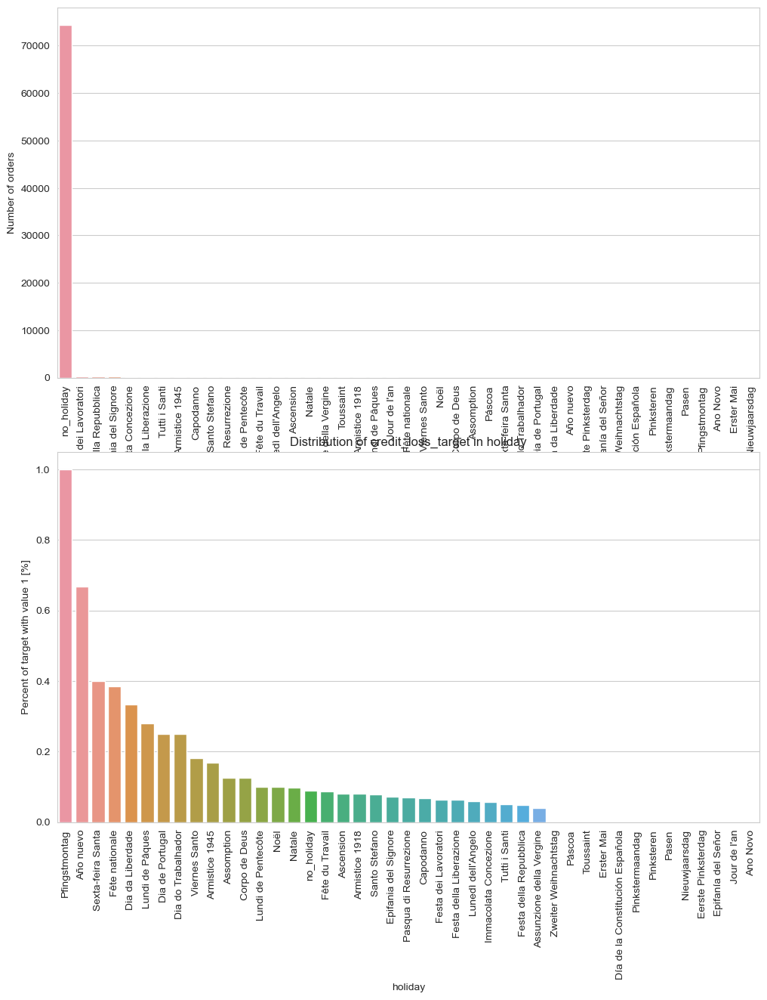

In [264]:
plot_stats(df_credit_v1, 'holiday',True, False, target='credit_loss_target')

In [282]:
    # Calculate the percentage of target=1 per category value
cat_perc = df_fraud_v1[['holiday', 'fraud_loss_target']].groupby(['holiday'],as_index=False).mean()
#cat_perc.sort_values(by=target, ascending=False, inplace=True)

In [283]:
cat_perc.sort_values(by='fraud_loss_target', ascending=False)

,holiday,fraud_loss_target
10,Dia de Natal,1.000000
21,Fronleichnam,1.000000
30,Navidad,1.000000
12,Dia do Trabalhador,0.666667
11,Dia de Portugal,0.666667
23,Fête nationale,0.628571
43,Viernes Santo,0.521739
8,Corpo de Deus,0.500000
36,Pinksteren,0.500000
9,Dia da Liberdade,0.400000


In [284]:
df_fraud_v1.query("holiday == 'Dia do Trabalhador'")

,order_token,user_token,country_code,dialing_prefix,number_complete_orders,order_created_at,order_amount,funding,merchant_id,total_default_pre_collections,total_collections_win,postcode_mapped,shipping_country,user_tenure_days,user_age,city,currency_code,is_eu,location_language,location_capital,timezone_id,timezone_current_hour,current_time_tz,is_daylight_saving,is_tor,is_proxy,is_crawler,threat_level,deviceid,location_postal_code,fraud_loss_target,credit_loss_target,device_id_count,holiday
2749,BDBL2NDKSEW,261L2NDE8GB,PT,351,0,2022-05-01 14:15:37+00:00,646.50,debit,219,431.00,0.00,243048,PT,0,22.0,Montijo,EUR,True,pt,Lisbon,Europe/Lisbon,15.0,2022-05-01 14:11:18+00:00,True,False,False,False,False,7951bd2781f5e9f6c4d7dc1e129a33f8,Invalid postal code,True,False,2,Dia do Trabalhador
3582,6305L2N22PP3,115KZ4DJ5TU,PT,351,0,2022-05-01 08:53:38+00:00,59.80,debit,773,0.00,0.00,2316973,PT,88,28.0,Alfragide,EUR,True,pt,Lisbon,Europe/Lisbon,9.0,2022-05-01 08:49:35+00:00,True,False,False,False,False,b3ef72d8e96d0f29d71011aea413ba93,Invalid postal code,False,False,1,Dia do Trabalhador
12758,3A25L2MTWDAA,354L2MOH6Z2,PT,351,1,2022-05-01 05:04:45+00:00,66.92,debit,2597,44.61,0.00,2603623,PT,0,24.0,Alfragide,EUR,True,pt,Lisbon,Europe/Lisbon,3.0,2022-05-01 02:33:22+00:00,True,False,False,False,False,0ae114156fb61211221e21d001232647,Invalid postal code,True,False,1,Dia do Trabalhador
18791,7A25L2N7XNVA,2B1L0AR3YBD,PT,351,1,2022-05-01 11:37:40+00:00,30.69,debit,2597,0.00,0.00,252831,PT,59,23.0,Alfragide,EUR,True,pt,Lisbon,Europe/Lisbon,12.0,2022-05-01 11:37:58+00:00,True,False,False,False,False,690170db064cd078de5d35915d0e0924,Invalid postal code,False,False,2,Dia do Trabalhador
21377,DDBL2NUOOI1,198L2NUPO3D,PT,351,0,2022-05-01 22:14:32+00:00,596.50,credit,219,397.67,0.00,2419605,PT,0,21.0,Alfragide,EUR,True,pt,Lisbon,Europe/Lisbon,23.0,2022-05-01 22:15:35+00:00,True,False,False,False,False,d43b9d1e6848ffd426867838d662e7ac,Invalid postal code,True,False,2,Dia do Trabalhador
40626,DDBL2N7MNKZ,6BL2N78W1R,PT,351,0,2022-05-01 11:29:07+00:00,665.50,credit,219,443.67,0.00,200767,PT,0,21.0,Alvalade,EUR,True,pt,Lisbon,Europe/Lisbon,12.0,2022-05-01 11:19:24+00:00,True,False,False,False,False,919467424b846e0d77d53bb4857b5a53,Invalid postal code,True,False,1,Dia do Trabalhador
70828,BA25L2NSXXBL,12EL1FJ52RN,PT,351,1,2022-05-01 21:25:44+00:00,73.18,credit,2597,0.00,0.00,2882815,PT,30,29.0,Porto,EUR,True,pt,Lisbon,Europe/Lisbon,22.0,2022-05-01 21:18:19+00:00,True,False,False,False,False,10c77afb9023154753674793a10c42b5,Invalid postal code,False,False,1,Dia do Trabalhador
71524,1A25L2MK1RTR,372L2MDN1HO,PT,351,0,2022-05-01 00:29:01+00:00,128.25,debit,2597,85.50,0.00,2303422,PT,0,19.0,Alfragide,EUR,True,pt,Lisbon,Europe/Lisbon,22.0,2022-04-30 21:29:45+00:00,True,False,False,False,False,b5bbdf75611a911ca5ab6b41ed7e42c2,Invalid postal code,True,False,18,Dia do Trabalhador
84631,FA25L2MKNNPK,66L19BY896,PT,351,1,2022-05-01 00:46:02+00:00,34.99,credit,2597,11.66,11.66,2680826,PT,34,38.0,Paredes,EUR,True,pt,Lisbon,Europe/Lisbon,1.0,2022-05-01 00:46:44+00:00,True,False,False,False,False,fc65d6dd6f6b186b538c757cf7d20c3b,Invalid postal code,False,True,1,Dia do Trabalhador
84771,AA25L2N7AXE6,340L2N6UZML,PT,351,0,2022-05-01 11:19:59+00:00,17.43,debit,2597,11.62,0.00,2330682,PT,0,20.0,Braga,EUR,True,pt,Lisbon,Europe/Lisbon,12.0,2022-05-01 11:07:55+00:00,True,False,False,False,False,38f024c3b1a8323e76652ce5325ccdcd,Invalid postal code,True,False,1,Dia do Trabalhador


In [315]:
from datetime import datetime
import holidays
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
def plot_stats(df, feature,label_rotation=False, horizontal_layout=True, target=None):
    temp = df[feature].value_counts()
    df1 = pd.DataFrame({feature: temp.index,'Number of orders': temp.values})

    # Calculate the percentage of target=1 per category value
    cat_perc = df[[feature, target]].groupby([feature],as_index=False).mean()
    cat_perc.sort_values(by=target, ascending=False, inplace=True)
    
    
    if(horizontal_layout):
        fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12,6))
    else:
        fig, (ax1, ax2) = plt.subplots(nrows=2, figsize=(12,14))
    sns.set_color_codes("pastel")
    s = sns.barplot(ax=ax1, x = feature, y="Number of orders",data=df1)
    ax1.set_ylim(0,80000)
    ax1.yaxis.set_ticks(np.arange(0, 80000, 5000))

    #plt.yticks(np.arange(0, 80000, 5000))


    if(label_rotation):
        s.set_xticklabels(s.get_xticklabels(),rotation=90)
    
    s = sns.barplot(ax=ax2, x = feature, y=target, order=cat_perc[feature], data=cat_perc)
    if(label_rotation):
        s.set_xticklabels(s.get_xticklabels(),rotation=90)
    
    plt.ylabel('Percent of target with value 1 [%]', fontsize=10)
    plt.tick_params(axis='both', which='major', labelsize=10)
    
    plt.title(f'Distribution of {target} in {feature}')
    #print(f'Sample size for df_credit: {credit_sample_size} ({credit_sample_percentage:.2f}%)')

    plt.show()


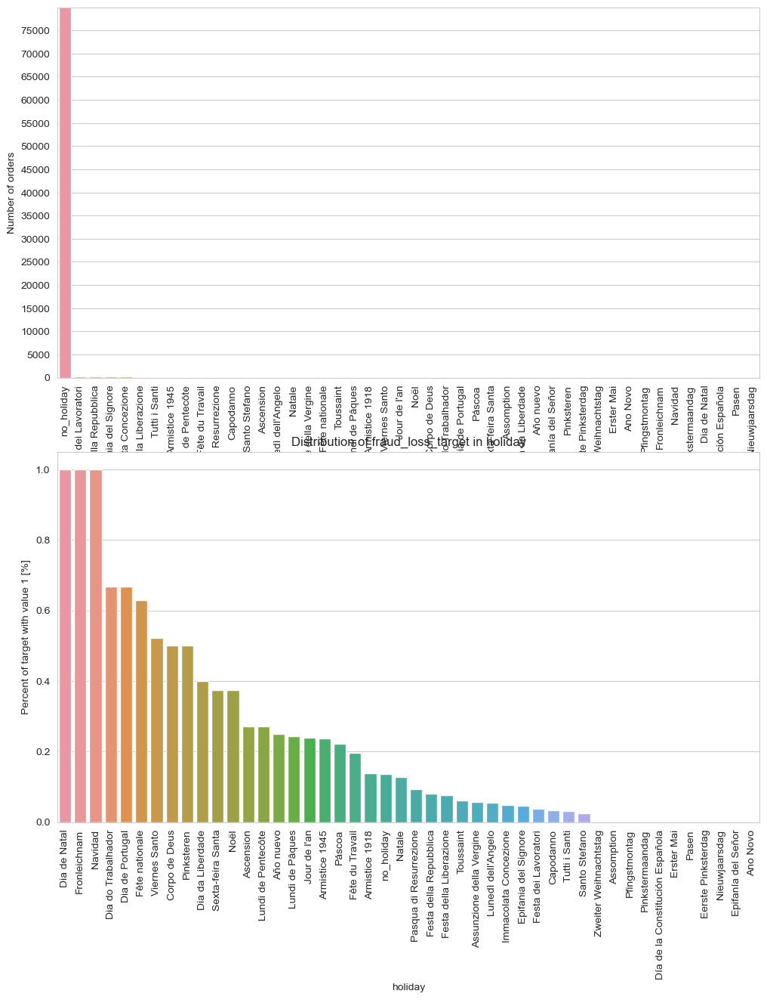

In [316]:
plot_stats(df_fraud_v1, 'holiday',True, False, target='fraud_loss_target')

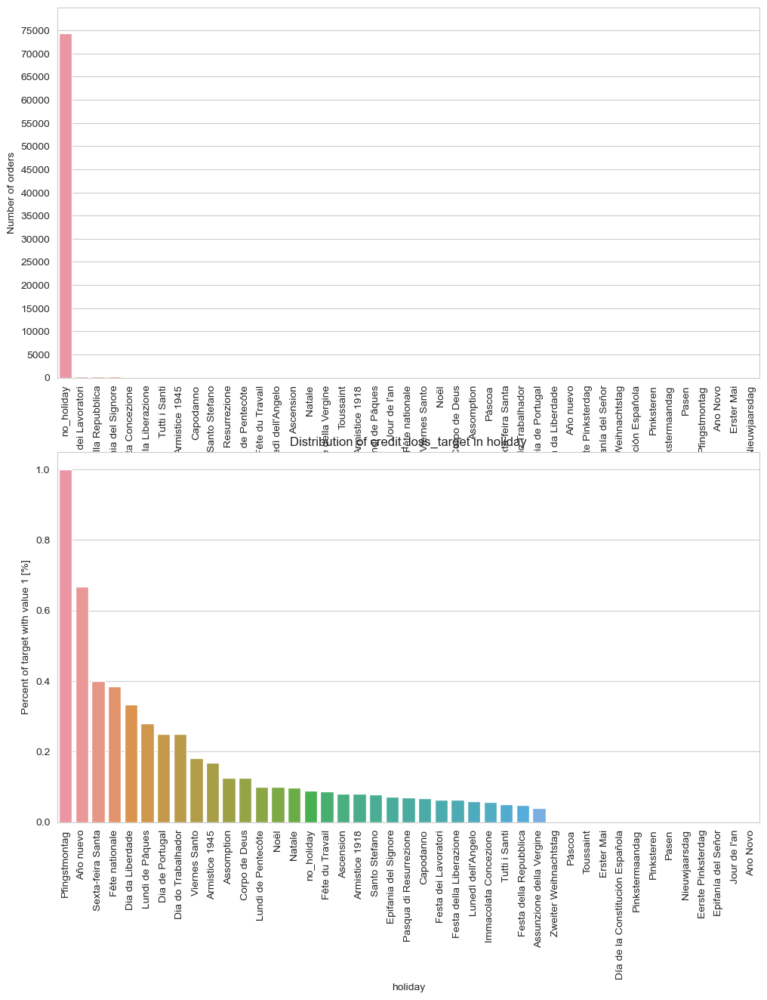

In [317]:
plot_stats(df_credit_v1, 'holiday',True, False, target='credit_loss_target')

/Users/admin/miniconda3/envs/frozen/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 44053 (\N{HANGUL SYLLABLE GANG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/admin/miniconda3/envs/frozen/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 50896 (\N{HANGUL SYLLABLE WEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/admin/miniconda3/envs/frozen/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 46020 (\N{HANGUL SYLLABLE DO}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/admin/miniconda3/envs/frozen/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 45824 (\N{HANGUL SYLLABLE DAE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/admin/miniconda3/envs/frozen/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 54620 (\N{HANGUL SYL

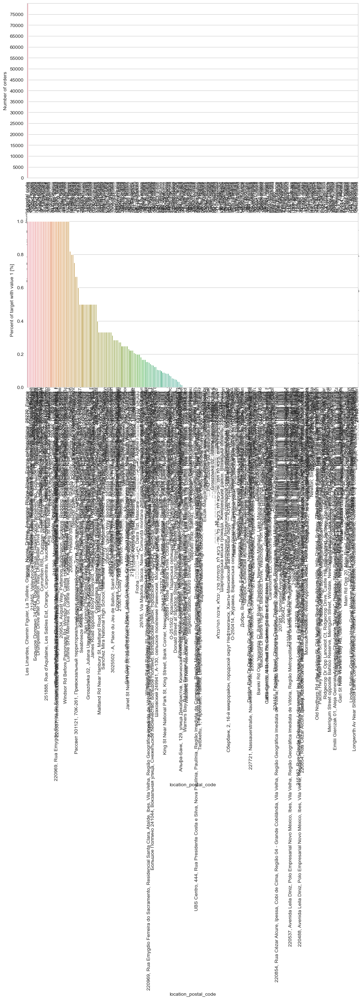

In [324]:
#df_fraud_v1.query("  location_postal_code !=  'Invalid postal code' and fraud_loss_target == True ")
plot_stats(df_fraud_v1, 'location_postal_code',True, False, target='fraud_loss_target')

In [326]:
df_fraud_v1.query("  location_postal_code !=  'Invalid postal code' and fraud_loss_target == True ").T

,46639,46860,46865,46901,47071,47114,47125,47302,47675,47678,47733,47857,47887,48092,48747,48849,48965,49095,49431,50162,50370,51299,51384,51387,51560,51561,51646,51767,51808,51931,51949,51958,52086,53461,53620,53927,53951,54370,54646,54897,55490,55659,55895,55972,56171,56380,57216,57527,57553,57683,58220,58277,58324,58421,58457,58556,58887,58984,60684,61188,61534,61549,61843,63048,63223,63248,63499,63890,63939,64067,64197,64204,64348,64407,64775,64848,64998,65120,65126,65271,65343,65489,65535,65643,65648,65707,66014,66084,66118,66177,66358,66407,66534,66744,67448,68274,69098,69135,70697,71473,71916,72023,72921,73031,73233,73689,73925,74107,74163,74453,74874,75056,75137,75143,75537,75552,75558,75714,75717,75932,76529,76584,76627,76657,76862,77088,77273,77317,77329,77941,78106,78399,78492,78521,78589,78685,79210,79523,79763,79767,80018,80116,80322,80607,80902,81091,81447,81740,81836,81876,82415,82457,82592,82977,83046,83962,83978,84316,84466,84586,84664,84748,84824,84890,84978,85118,85215,85324,85413,85493,85604,86213,86469,86725,86752,86813,86850,87034,87188,87381,87533,87559,88104,88336,88550,88684,89260,89695,89902,90585,90678,90847,91187,91518,92721,92849,93504,93532,93657,93695,93731,94500,94802,95091,95127,95261,95377,95422,95629,95721,95868,95873,95915,95937,96050,96408,96908,97380,97559,97639,97752,97784,98108,98504,99621,99929,100226,100361
order_token,030BL1UY1QI3,FA25L0DTJ48R,CA25L2T6KO7B,CMT4IRNDJTNU,4113KB3DE2T4,0A25KZY8AT8B,AJ0DP1B4CZ8S,4A74L2YS6RIO,2A25L0O8DMD0,DF2KZZBGGL0,F46EL0DSKYYC,90AAO6GDSTSY,AH8K9VZETY8V,HKSDX8RW8QY8,MYI73FA4CE9U,IGZM8BJ7RG7V,8DBKT1BNW5V,96D4KZAIQSMG,D305KYOLZ5XA,FA25L2US422G,E2C3KOG4GAPI,89B9L2KEAXP6,FSHMG4S92FCN,B8ACKZJXHRSU,A8ACKZVHML3N,FDBKWX8RRRJ,F44KNN8HGIB,962CKZZQEYLA,SNN9QOQZU7SF,E788L1KP3EQN,73BDKODCTQFJ,0EBKTNO6B9T,4211KTX47SLV,26C0KW6SY2CP,HLUV2CZW4WMI,AA0DL0G8TSJZ,1A25L1KK890X,ADBKXQTTY3J,VVOGJPP36M8A,55PKW1BQYMZ5,X96D8TR2CCI1,5CRT1K3PMCKN,1A25L0WB51AD,4A25L2YF8RQ5,7718KXLHX7KA,46C0KYIY4AO9,F8NV8NIABGRG,63KNN6HRW72A,DA25L20F1F4P,426EKP9XVUPS,ATIXQMAIQZV2,4DBL190GO4R,2A25L2HD13NI,36CAL2VW8POV,5EBKU8JA7NO,878FKUFKM7H7,C3A0KPUWXFP0,41A5L07QA2GU,17B2JN6V7EGQ,55F28P8P85WS,8305KPEKI2BW,YODMJB2NLZGG,IHRGL64BTQKE,9305L00TUL4D,8A25L2U89WZD,1A25L0G3ZK1W,AA25L2VZU3HJ,5A25L1HYBO3H,0232KNEC2Z22,0A25L07EJ5EU,L4J5GCJ955YE,5A25L1ZMAYSN,0BNC7FDSA758,4A25L09C1CQU,B371KYK5J1GB,A62CL2CC97AE,FA25L1V6JK6E,1DBKY7KPQVT,N65G3AY1OL5A,26NBBRHZ32KS,621AL2MZXEQC,BYCV4P9KWOTR,A818L1S6KOD3,KIP6HT9WR1MX,C6C0KZ5GHE5M,EA25L1KVLM54,ATISI3BL77EP,551KTEZZBKX,8232KP88JIO6,4DBL0TH6HSD,9A25L212XAJD,TMF8J83PEAYI,621BKWHLRHQI,D058VFF9NSP4,5SJI9315IF3Q,B305KNSOIDT5,0A25L35WKT8G,778FKX201Y4X,C57KXGFI8NM,7A25L2TKLRHH,SH1XMZROY463,35A2KVA3UK9K,C21AKZ8NSELZ,5A25L1GRU77V,0A25KYDWV7I0,CA25L06OU6L4,VE8JFF0JX64V,56D4KV9D74NF,EA25L010OZT7,1DBKSEHZ25W,A849L1LLY9OC,9T5XXPVBWWFS,26D6L1RXNAMH,SSQC8DIXSR24,1A25L0DPR7YK,CA25L058H3YT,72DA9N1CCSP5,H7A9JQGVFKVX,L96GDYI8UQ00,STQ5LYG5L02Z,A30EKOMO7MFQ,821BKOMOFR7X,6A25L0PY0TBQ,5232KSA19C03,3A25L2JI0ZWC,DA25L1LY8H44,0A25L1NHL85Z,0IQTUCGBC06L,5A25L0LF4QC5,BA9L0JB44YT,9A25L14SJ2X7,66D6L2JG52SO,4A25L2G94RAP,ZGM4NBJQLWEB,EM24IML71MXL,MDIAATAESAXN,6A25L322SD3Z,881DKXS4BJK7,0B23L0A54V5C,BA35L04KHFCT,B2F7KXNJ8VH3,8A34L0JYNE94,57V39R9KAEOG,EDBKXPVQIC5,2265KX7S04UQ,U056U77ETS01,F305KY23F917,OYQ2JW7GBTN2,B33CL0TT2PWO,FA25L2W7N8NO,6A25L0CYC36F,PLIXUK6B7ZLQ,5A25L0VNW87V,0C57L38F0WKY,9ICMK2E51ITV,WXKHAQDKVXF5,9BK8BSIUR859,7A25L2QMUKCS,YP8SVXWYA6PJ,2WHFUKX1IJ13,KRVCVMJ491WY,5BAKNEF7ZXC,C2F7KZ4EHF73,XPX6Z2IJ7U10,TXHVQFJ791FK,3A25L20ZXOTR,E165KP4DREES,26C0KUBTH808,HA28EHSL6ZO0,JT0QKVCUROC9,9A25L0A3UQX3,5A25L31EKDE8,RLEOATJSRN8D,6IO3UC3UM211,5754L1D3843A,CGUYSGJK9MBS,1A25L21TGC9S,EA30L0CGQEGI,C981L06S55LQ,1A25L1UGK1TT,8981L0FHVG0V,61A5KYEFDRGY,F305KOIR03XV,06C0L1QWGDJR,5981L08AMX4A,2A25L2SQVHNE,8101KLK7FZJO,D7EK6FM3NTP7,48D2L0UXPD13,E19AKW0Q9CIL,9A25L30LBUVD,8DBL1YNF23M,881KMW3XGAP,6VZVYMS8QGT2,F374KL8KD39L,FA25L2W9VJ1Z,EEBKUZUL997,8A25L0K0I6N2,9A25L2NJXICL,BDBL2KL4UA7,652K84RA0WS,INFS4RZFKX22,DA25L0IAKVH4

In [1]:
df_credit_v1.query("  is_eu == False and location_postal_code != 'Invalid postal code'").T

NameError: name 'df_credit_v1' is not defined

In [348]:
# Step 1: Create a dictionary that maps each capital to its corresponding country
country_abbreviations = {'Rome': 'IT', 'Paris': 'FR', 'Madrid': 'ES', 'Fort-de-France': 'MQ', 'Berlin': 'DE', 'Lisbon': 'PT',
       'Brussels': 'BE', 'Washington D.C.': 'US', 'Bern': 'CH', 'Amsterdam': 'NL', 'Warsaw': 'PL',
       'Riyadh': 'SA', 'Bogotá': 'CO', 'Rabat': 'MA', 'Vienna': 'AT', 'Saint-Denis': 'RE', 'London': 'GB',
       'Tunis': 'TN', 'Cayenne': 'GF', 'Basse-Terre': 'GP', 'Cairo': 'EG', 'Bucharest': 'RO',
       'Helsinki': 'FI', 'City of San Marino': 'SM', 'Copenhagen': 'DK', 'Monaco': 'MC',
       'Stockholm': 'SE', 'Dublin': 'IE', 'Port Louis': 'MU', 'Nassau': 'BS', 'Brasília': 'BR',
       'Kralendijk': 'BQ', 'Singapore': 'SG', 'Pretoria': 'ZA', 'Mamoudzou': 'YT', 'Ottawa': 'CA',
       'Luxembourg': 'LU', 'Kyiv': 'UA', 'Yaoundé': 'CM', 'Tokyo': 'JP', 'Yamoussoukro': 'CI', 'Athens': 'GR',
       'Beirut': 'LB', 'Belgrade': 'RS', 'Kuwait City': 'KW', 'Nairobi': 'KE', 'Libreville': 'GA',
       'Reykjavik': 'IS', 'Chișinău': 'MD', 'Prague': 'CZ', 'Budapest': 'HU', 'New Delhi': 'IN',
       'Vilnius': 'LT', 'Bamako': 'ML', 'Zagreb': 'HR', 'Santo Domingo': 'DO', 'Nouméa': 'NC', 'Skopje': 'MK',
       'Tirana': 'AL', 'Algiers': 'DZ', 'Papeetē': 'PF', 'Abu Dhabi': 'AE'}

# Step 2: Use the map() function to create a new column in the dataframe with the corresponding country abbreviation
df_credit_v1['location_country'] = df_credit_v1['location_capital'].map(country_abbreviations)
df_fraud_v1['location_country'] = df_credit_v1['location_country'].map(country_abbreviations)


/var/folders/dc/19g8x7m956bdv97zjz8skp8r0000gp/T/ipykernel_62363/3099189691.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_fraud_v1['location_country'] = df_credit_v1['location_country'].map(country_abbreviations)


In [354]:
df_fraud_v1.query("location_capital.isnull()")

,order_token,user_token,country_code,dialing_prefix,number_complete_orders,order_created_at,order_amount,funding,merchant_id,total_default_pre_collections,total_collections_win,postcode_mapped,shipping_country,user_tenure_days,user_age,city,currency_code,is_eu,location_language,location_capital,timezone_id,timezone_current_hour,current_time_tz,is_daylight_saving,is_tor,is_proxy,is_crawler,threat_level,deviceid,location_postal_code,fraud_loss_target,credit_loss_target,device_id_count,holiday,location_country
26832,BA25L0WYLDOS,283L09YHXRM,FR,33,0,2022-03-18 21:54:28+00:00,11.02,debit,2597,39.59,0.0,20371,FR,16,21.0,Afyonkarahisar,TRY,False,tr,NaN,Europe/Istanbul,11.0,2022-03-18 08:50:19+00:00,False,False,False,False,False,25a019fc1f36d5bc5854f6a50cf05793,Invalid postal code,True,False,1,no_holiday,NaN
33071,854AL0AWIAO7,68L0AWIO0C,FR,33,0,2022-03-03 11:25:09+00:00,84.97,debit,1354,28.32,0.0,2670247,FR,0,30.0,Andorra la Vella,EUR,False,ca,NaN,Europe/Andorra,12.0,2022-03-03 11:25:45+00:00,False,False,False,False,False,2da04394a0f21f426d967860f37d0917,Invalid postal code,True,False,1,no_holiday,NaN
36761,BA25L2DKE8DA,146L2DKGE5L,FR,33,0,2022-04-24 17:28:47+00:00,137.71,debit,2597,91.81,0.0,2100195,FR,0,21.0,Banjul,GMD,False,en,NaN,Africa/Banjul,17.0,2022-04-24 17:31:59+00:00,False,False,False,False,False,b5c90fd795f6f1cc41878e066ae9fcef,Invalid postal code,True,False,1,no_holiday,NaN
62101,OM96SJNPZOHG,E44F88KMCTOV8M,IT,39,2,2022-06-04 20:16:25+00:00,69.12,prepaid,410,46.08,0.0,2778918,IT,503,51.0,Dakar,XOF,False,fr,NaN,Africa/Dakar,20.0,2022-06-04 20:34:06+00:00,False,False,False,False,False,7d17ac7ad71fc40dc3f801dbe9f371d5,Invalid postal code,True,False,1,no_holiday,NaN
98712,E171KUYV3RZK,E58D56KM16SK9B,IT,39,12,2021-10-20 01:54:06+00:00,295.50,prepaid,369,98.50,0.0,2686633,IT,225,45.0,San Clemente,PEN,False,es,NaN,America/Lima,20.0,2021-10-20 01:32:39+00:00,False,False,False,False,False,f2571426df0c777027237047148e1c0d,Invalid postal code,True,False,1,no_holiday,NaN


In [355]:
from personalpipeline.src.preprocessing import eda
eda.Eda()

In [357]:
eda.Eda().missing_values_table(df)

Your selected dataframe has 32 columns.
There are 17 columns that have missing values.


,Missing Values,% of Total Values
shipping_country,4634,4.6
timezone_id,3050,3.0
timezone_current_hour,3050,3.0
current_time_tz,3050,3.0
is_daylight_saving,3050,3.0
city,2443,2.4
currency_code,2427,2.4
is_crawler,2426,2.4
threat_level,2426,2.4
is_eu,2426,2.4


In [358]:
df_fraud_v1.location_capital.nunique()

54

In [359]:
df_credit_v1.location_capital.nunique()

62

In [361]:
df.location_capital.unique()

array(['Rome', 'Paris', 'Madrid', 'Lisbon', 'Fort-de-France', 'Berlin',
       'London', nan, 'Brussels', 'Washington D.C.', 'Bern',
       'Saint-Denis', 'Vienna', 'Amsterdam', 'Warsaw', 'Riyadh', 'Bogotá',
       'Rabat', 'Ottawa', 'Algiers', 'Bucharest', 'Tunis', 'Cayenne',
       'Basse-Terre', 'Cairo', 'Helsinki', 'City of San Marino',
       'Copenhagen', 'Monaco', 'Stockholm', 'Dublin', 'Port Louis',
       'Nassau', 'Brasília', 'Mexico City', 'Ankara', 'Kralendijk',
       'Singapore', 'Pretoria', 'Mamoudzou', 'Andorra la Vella',
       'Luxembourg', 'Kyiv', 'Banjul', 'Yaoundé', 'Tokyo', 'Vilnius',
       'Yamoussoukro', 'Athens', 'Beirut', 'Belgrade', 'Kuwait City',
       'Nairobi', 'Libreville', 'Valletta', 'Dakar', 'Reykjavik',
       'Chișinău', 'Prague', 'Budapest', 'New Delhi', 'Bamako', 'Zagreb',
       'São Tomé', 'Santo Domingo', 'Nouméa', 'Skopje', 'Tirana', 'Lima',
       'Papeetē', 'Abu Dhabi'], dtype=object)